---
title: "Make predictions as lasso model of SPI tree depth & compare to model trained on OGG presence"

author: "Benjamin Doran"

date: today

---

## Setup

In [1]:
using DrWatson
@quickactivate "Doran_etal_2022"

using SPI, MLJ
using MLJBase: train_test_pairs
using Clustering, Distances
using Muon, CSV, DataFrames
using StatsPlots, StatsBase
theme(:default, grid=false, label="")
using NewickTree, NewickTreeTools
using Gotree_jll
using Random: seed!
using FreqTables
using Distances
using NearestNeighbors

getlims(x) = x |> extrema |> x->abs.(x) |> maximum |> x->(-x,x)

function getlims(x, y) 
    lims = extrema(vcat(x, y))
    lims =  lims .+ (-(lims[2] - lims[1]) * 0.1, (lims[2] - lims[1]) * 0.1)
end

Base.@kwdef struct GroupedEuclidean{T} <: Metric
    groups::Vector{T}
end
function (dist::GroupedEuclidean)(r, a, b)
    for grp in dist.groups
        r += sqrt(sum(abs2.(a[grp] .- b[grp])))
    end
    r
end
function (dist::GroupedEuclidean)(a, b)
    r = zero(eltype(a))
    dist(r, a, b)
end
function (dist::GroupedEuclidean)(a::Number, b::Number)
    euclidean(a, b)
end
groupedeuclidean(a, b, intervals=collect(axes(a,1))) = GroupedEuclidean(intervals)(a, b)
groupedeuclidean!(r, a, b, intervals=collect(axes(a,1))) = GroupedEuclidean(intervals)(r, a, b)

get_predictions(ŷ, y) = ŷ
MLJ.reports_each_observation(::typeof(get_predictions)) = true;

In [2]:
# @load LogisticClassifier pkg=MLJLinearModels verbosity=0
@load LassoRegressor pkg=MLJLinearModels verbosity=0
@load MultinomialClassifier pkg=MLJLinearModels verbosity=0
@load OneHotEncoder pkg=MLJModels verbosity=0
# DecisionTreeRegressor = @load DecisionTreeRegressor pkg=DecisionTree

OneHotEncoder

In [3]:
ddir = datadir("exp_pro", "BB728")
rdir = projectdir("_research", "metabolite_SBA_Lasso_model_mark2") |> mkpath
pdir = plotsdir("metabolite_SBA_Lasso_model_mark2") |> mkpath
biobank = readh5mu(joinpath(ddir, "BB728.h5mu"))

┌ Warning: Cannot join columns with the same name because var_names are intersecting.
└ @ Muon /Users/ben/.julia/packages/Muon/eLqpV/src/mudata.jl:351


MuData object 728 ✕ 21485
└ metabolites_foldchange
  AnnData object 728 ✕ 50
└ metabolites_millimolar
  AnnData object 728 ✕ 10
└ UPorder_oggs
  AnnData object 728 ✕ 10177
└ oggs
  AnnData object 728 ✕ 11248

In [4]:
# keptspecies = first(keys(sort(countmap(biobank.obs.species), byvalue=true, rev=true)),12)[Not(6)]

In [5]:
trn_mask = biobank.obs.inBB673 .== 1
tst_mask = biobank.obs.inBB673 .== 0
trn_mtx = biobank["UPorder_oggs"].X[:,:][trn_mask, :]
tst_mtx = biobank["UPorder_oggs"].X[:,:][tst_mask, :];
mtx = biobank["UPorder_oggs"].X[:,:];

In [6]:
bbusv = SVD(
    biobank["UPorder_oggs"].obsm["inferredLSVs"][:,:],
    biobank["UPorder_oggs"].uns["UP_SVs"][:],
    biobank["UPorder_oggs"].varm["UP_RSVs"][:, :]',
    );
norm(mtx .- projectout(bbusv)) / norm(mtx)

0.03065109952898508

In [7]:
sigresdf = CSV.read(joinpath(ddir, "significant_metabolites_in_subsetSPItree_numisolatesperspecies=+20.csv"), DataFrame)

earlytreesigmetabolitesdf = filter(:node_depth_maxeffect => >(3.5), sigresdf) |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df, :effect_size_abs => maximum) |>
    df -> sort(df, :effect_size_abs_maximum, rev=true)
middletreesigmetabolitesdf = filter(:node_depth_maxeffect => (x)-> 2 .< x .< 3.5, sigresdf) |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df, :effect_size_abs => maximum) |>
    df -> sort(df, :effect_size_abs_maximum, rev=true)
latetreesigmetabolitesdf = filter(:node_depth_maxeffect => <(2), sigresdf) |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df, :effect_size_abs => maximum) |>
    df -> sort(df, :effect_size_abs_maximum, rev=true);

metabolite_has_effectsize_mask = vcat(
    earlytreesigmetabolitesdf,
    middletreesigmetabolitesdf,
    latetreesigmetabolitesdf,
).effect_size_abs_maximum .> 0.6;

orderedmetabolites_names = vcat(
    earlytreesigmetabolitesdf.metabolite_name,
    middletreesigmetabolitesdf.metabolite_name,
    latetreesigmetabolitesdf.metabolite_name,
);
metabolite_mask_ord_early = indexin(earlytreesigmetabolitesdf.metabolite_name, replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""));
metabolite_mask_ord_middle = indexin(middletreesigmetabolitesdf.metabolite_name, replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""));
metabolite_mask_ord_late = indexin(latetreesigmetabolitesdf.metabolite_name, replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""));
metabolite_mask_ord = indexin(orderedmetabolites_names, replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""));

removed from 38 metabolites: "Alanine", "Crotonate", "Phenylalanine"

In [67]:
removedmetabs = biobank["metabolites_foldchange"][:, ["Alanine_rel", "Crotonate_rel", "Phenylalanine_rel"]].X[:, :][full_train_mask, :]
std(removedmetabs, dims=1)

1×3 Matrix{Float64}:
 0.425079  0.602295  0.418399

In [8]:
bb_met_lfc = biobank["metabolites_foldchange"].X[:, :];
bb_met_lfc[isinf.(bb_met_lfc)] .= 0.0;
metabolicdistance = pairwise(Euclidean(), bb_met_lfc; dims=1);

In [9]:
metabolicallyvariabledf = biobank.obs[trn_mask, :] |>
    df->DataFrames.transform(df, eachindex => :rowid) |>
    df->groupby(df, :species) |>
    df->combine(df, 
        nrow => :num_isolates, 
        :rowid => ((x)->maximum(metabolicdistance[x,x])) => :max_metabolicdistance,
        :rowid => ((x)->maximum(metabolicdistance[x,x]) > 20) => :isvariable,
        ) |>
    df->filter(:num_isolates => >=(10), df) |>
    df->sort(df, [:max_metabolicdistance, :num_isolates], rev=true)

specieswith20reps = metabolicallyvariabledf |>
    df -> filter(:num_isolates => >=(20), df) |>
    df -> filter(:species => !=("unclassified"), df) |>
    df -> sort(df, :num_isolates, rev=true)


spe20rep_mask = .!isnothing.(indexin(biobank.obs.species[trn_mask], specieswith20reps.species));

In [10]:
full_train_mask = zeros(Bool, 728)
full_train_mask[trn_mask] .= spe20rep_mask;

full_test_mask = ones(Bool, 728)
full_test_mask[trn_mask] = .!spe20rep_mask
sum(full_train_mask), sum(full_test_mask)

(356, 372)

In [11]:
bbmtx = biobank["oggs"].X[:, :]
bbmtx_trn = bbmtx[full_train_mask, :]
bbmtx_tst = bbmtx[full_test_mask, :]
# filter out oggs that are constant
ogg_mask = vec(mapslices(c->std(c) > 0, bbmtx_trn, dims=1))
bbmtx_trn = bbmtx_trn[:, ogg_mask]
bbmtx_tst = bbmtx_tst[:, ogg_mask]
zbbmtx_trn = mapslices(StatsBase.zscore, bbmtx_trn, dims=1)
zbbmtx_tst = mapslices(StatsBase.zscore, bbmtx_tst, dims=1)
replace!(zbbmtx_tst, NaN=>0.) # replace zscored NaNs with zeros (it's what they were before)
bbusv_internal = svd(zbbmtx_trn)
BBUinternal_tst = projectinLSV(zbbmtx_tst, bbusv_internal)
BBpcs_trn = bbusv_internal.U * diagm(bbusv_internal.S)
BBpcs_tst = BBUinternal_tst * diagm(bbusv_internal.S);

In [12]:
size(zbbmtx_trn)

(356, 5449)

In [13]:
biobank.obs[!, "species_donor"] = biobank.obs.species .* "_" .* biobank.obs.donor
bbobs_trn = biobank.obs[full_train_mask, :]
bbobs_tst = biobank.obs[full_test_mask, :];

In [14]:
subsetDij = biobank["UPorder_oggs"].obsp["SDij"][full_train_mask, full_train_mask];
subsettree_hc = hclust(subsetDij, linkage=:average, branchorder=:optimal)
subsettreestring = SPI.nwstr(subsettree_hc, bbobs_trn.ID; labelinternalnodes=false)
subsettree = readnw(subsettreestring);

In [15]:
trnX = mtx[full_train_mask, :]
trnYdf = bbobs_trn;

metab_trnY = bb_met_lfc[full_train_mask, metabolite_mask_ord];
metab_tstY = bb_met_lfc[full_test_mask, metabolite_mask_ord];

measurable_metabolites_mask = mapslices(c->mean(c .==0.) < .9, metab_trnY, dims=1)|>vec;
keepmetabolites_mask = measurable_metabolites_mask .& metabolite_has_effectsize_mask

PCs_trnX = DataFrame(BBpcs_trn[:, 1:10], :auto);
PCs_tstX = DataFrame(BBpcs_tst[:, 1:10], :auto);

In [16]:
# Find metabolites with improvement in full spectral model over top 3 model
lasso_oof_preds_df = CSV.read(projectdir("_research/metabolite_lasso_model/oof_lasso_preds_lambda=0.01.csv"), DataFrame);
# nrmse(y, ŷ) = rmse(y, ŷ) / mean(y)
mnames = orderedmetabolites_names[keepmetabolites_mask]
function get_scores(fun, df, predname, groupcol=:fold) 
    combine(groupby(df, groupcol)) do gdf 
        ŷs = gdf[:, Cols(mnames .* "_pred_".* predname)]
        ys = gdf[:, Cols(mnames .* "_true")]
        scores = map(zip(eachcol(ŷs), eachcol(ys))) do (ŷ, y)
            fun(ŷ, y)
        end |> permutedims
        scores
    end |>
    Matrix |>
    x->getindex(x, :, axes(x,2)[2:end]) |>
    permutedims
end

func = rsquared

all_scores_perfold = map(["full", "top3"]) do type
    scores = get_scores(func, lasso_oof_preds_df, type, "fold")
    mean(scores, dims=2), std(scores, dims=2)
end
scores_means = hcat(first.(all_scores_perfold)...)
scores_stds = hcat(last.(all_scores_perfold)...);

all_scores_perfold = map(["full", "top3"]) do type
    scores = get_scores(func, lasso_oof_preds_df, type, "fold")
end

allscores_perfold = permutedims(stack(all_scores_perfold), [3,1,2]);

using HypothesisTests
using MultipleTesting: adjust, Bonferroni, BenjaminiHochberg

poweroftest = mapslices(allscores_perfold, dims=(1,3)) do m
        pvalue(UnequalVarianceTTest(m[1, :], m[2, :]))
    end |> 
    x->dropdims(x, dims=(1,3)) |>
    p->adjust(p, BenjaminiHochberg()) |> 
    p->filter(<(0.05), p) |>
    p->floor.(Int, log10.(1 ./ p))

bothmodelswork = (scores_means[:, end] .> 0.5) .| (scores_means[:, begin] .> 0.5) |> findall
issig = mapslices(allscores_perfold, dims=(1,3)) do m
        pvalue(UnequalVarianceTTest(m[1, :], m[2, :]))
    end |> 
    x->dropdims(x, dims=(1,3)) |>
    p->adjust(p, BenjaminiHochberg()) |>
    # p->adjust(p, Bonferroni()) |>
    p -> (p .< 0.05) |>
    findall
rsq_test_mask = unique(vcat(issig, bothmodelswork));

improvedmetabolite_mask = rsq_test_mask
improvedmetabolite_names = orderedmetabolites_names[keepmetabolites_mask][rsq_test_mask]

13-element Vector{String31}:
 "Propionate"
 "Succinate"
 "Tryptamine"
 "Glycine"
 "Butyrate"
 "Acetate"
 "Valerate"
 "Cysteine"
 "Tryptophan"
 "5-Aminovalerate"
 "Phenylacetate"
 "2-Methylbutyrate"
 "Isovaleric-Acid"

In [17]:
orderedmetabolites_names[keepmetabolites_mask][issig]

10-element Vector{String31}:
 "Propionate"
 "Succinate"
 "Tryptamine"
 "Glycine"
 "Butyrate"
 "Acetate"
 "Valerate"
 "Cysteine"
 "Tryptophan"
 "5-Aminovalerate"

In [18]:
powerofalltests_fullvstop3 = mapslices(allscores_perfold, dims=(1,3)) do m
        pvalue(UnequalVarianceTTest(m[1, :], m[2, :]))
    end |> 
    x->dropdims(x, dims=(1,3)) |>
    p->adjust(p, BenjaminiHochberg()) |> 
    # p->filter(<(0.05), p) |>
    p->floor.(Int, log10.(1 ./ p));

In [19]:
specieslabels = [
    "Bacteroides uniformis",
    "Phocaeicola vulgatus",
    "Bacteroides thetaiotaomicron",
    "[Ruminococcus] gnavus",
    "Bifidobacterium breve",
    "[Eubacterium] rectale",
    "Dorea formicigenerans",
    "Coprococcus comes",
    "Blautia luti & Blautia wexlerae",
    "Anaerostipes hadrus",
]
shapes = permutedims([:circle, :rect, :star5, :diamond, :hexagon, :ltriangle, :pentagon, :utriangle, :dtriangle, :rtriangle, :star4])
speciescolors = wload(joinpath(ddir, "subsettreecolors.jld2"))["colors"]
speciescolors_ordered = permutedims(speciescolors[replace(indexin(sort(unique(trnYdf.species)), specieslabels), nothing=>9)])

In [20]:
using Random: seed!
seed!(424242)
cv = StratifiedCV(nfolds=5, shuffle=true);
folds = train_test_pairs(cv, 1:sum(full_train_mask), trnYdf.species);

## Ancestral encoding cross-fold validation

### Make SPI-LASSO predictions

In [21]:
UPfullPCs = bbusv.U[full_train_mask, :] * diagm(bbusv.S[:]);
partitions = getintervals(bbusv.S);

In [22]:
rdir

"/Users/ben/projects/Doran_etal_2022/_research/metabolite_SBA_Lasso_model_mark2"

In [23]:
K = 1 # Make predictions with SPI-LASSO
λ = 1e-3
REPS = 5
NFOLDS = 4

seed!(424242)
cv = StratifiedCV(nfolds=NFOLDS, shuffle=true);
folds = vcat([train_test_pairs(cv, 1:sum(full_train_mask), trnYdf.species) for i in 1:REPS]...)


mdl = MLJLinearModels.LassoRegressor(lambda=λ)


# oof_preds_df_stacked = DataFrame()
# inf_preds_df_stacked = DataFrame()
# coefdf = DataFrame()
# for (i, (fold_trn, fold_tst)) in collect(enumerate(folds))
# # (i, (fold_trn, fold_tst)) = (1, folds[1])
# # (i, (fold_trn, fold_tst)) = (2, folds[2])

#     # Use tree to get lineage traces for each training and test sample
#     foldPCs = UPfullPCs[fold_trn,:]
#     trn_nns = map(r->partialsortperm(r, 1:K), eachrow(subsetDij[fold_trn, fold_trn]))
#     tst_nns = map(r->partialsortperm(r, 1:K), eachrow(subsetDij[fold_tst, fold_trn]))

#     foldhc = hclust(subsetDij[fold_trn, fold_trn], linkage=:average, branchorder=:optimal)
#     foldtree = readnw(SPI.nwstr(foldhc, trnYdf.ID[fold_trn], labelinternalnodes=false))
#     # ladderize!(foldtree, rev=false)
    
#     # Make SBA ancester encoding
#     trnXdf_all = map(prewalk(foldtree)) do node
#         tmp = zeros(length(fold_trn))
#         tmp[indexin(getleafnames(node), trnYdf.ID[fold_trn])] .= 1
#         "node__$(id(node))" => tmp
#     end |> DataFrame;
#     isinternal_fold = map(!isleaf, prewalk(foldtree));
#     treedists = mapinternalnodes(foldtree) do node
#         network_distance(foldtree, node)
#     end
#     trnXdf = trnXdf_all[:, isinternal_fold];
#     trnXdf = trnXdf[:, sortperm(treedists)];
#     rename!(trnXdf, ["node__$i" for i in 1:size(trnXdf, 2)])
    
#     # Get features for each out-of-fold isolate
#     tstXdf = map(tst_nns) do nn
#         trnXdf[nn, :] |>
#         df -> combine(df, [c => mean for c in 1:size(df, 2)])
#     end |> x->vcat(x...)
#     # rename!(tstXdf, ["node__$i" for i in 1:size(tstXdf,2)])

#     # fit lasso model
#     individual_metabolite_results = []
#     # (target_idx, target) = findfirst(==("Phenylacetate"), orderedmetabolites_names),"Phenylacetate"
#     for (target_idx, target) in enumerate(orderedmetabolites_names)
#         mach = machine(mdl, trnXdf, metab_trnY[fold_trn, target_idx])
#         Base.with_logger(Base.NullLogger()) do
#             fit!(mach, verbosity=0)
#         end
        
#         # save results of trained model
#         inf_preds_df_stacked = vcat(inf_preds_df_stacked, DataFrame(
#             :row_id => fold_trn,
#             :metabolite_name => target,
#             :fold => ((i-1)%NFOLDS)+1,
#             :resample => ((i-1)÷NFOLDS)+1,
#             :truth => metab_trnY[fold_trn, target_idx],
#             :preds => MLJ.predict(mach, trnXdf),
#         ))

#         oof_preds_df_stacked = vcat(oof_preds_df_stacked, DataFrame(
#             :row_id => fold_tst,
#             :metabolite_name => target,
#             :fold => ((i-1)%NFOLDS)+1 ,
#             :resample => ((i-1)÷NFOLDS)+1 ,
#             :truth => metab_trnY[fold_tst, target_idx],
#             :preds => MLJ.predict(mach, tstXdf),
#         ))

#         coefdf = vcat(coefdf, stack(DataFrame(fitted_params(mach).coefs)) |>
#             df -> begin df[!, :treedist] .= sort(treedists); df end |>
#             df-> DataFrames.select(df,
#                 :value => ByRow(x->target) => :metabolite_name,
#                 :value => ByRow(x->i) => :fold,
#                 :variable => (x->split.(x, "__")) => [:treedepth, :class],
#                 :variable => :node_id,
#                 :value => :coef,
#                 :treedist,

#             )
#         )
#     end;
#     println("on $(i)th resample")
# end

# oof_preds_df = leftjoin(
#     unstack(oof_preds_df_stacked, [:row_id, :fold, :resample], :metabolite_name, :truth; renamecols=(s)-> s*"_true"),
#     unstack(oof_preds_df_stacked, [:row_id, :fold, :resample], :metabolite_name, :preds; renamecols=(s)-> s*"_pred_sbalasso"),
#     on=[:row_id, :fold, :resample],
# )
# CSV.write(joinpath(rdir, "oof_predictions_SPItreeLASSO_ancestralencoding_lambda=$(λ).csv"), oof_preds_df)
# inf_preds_df = leftjoin(
#     unstack(inf_preds_df_stacked, [:row_id, :fold, :resample], :metabolite_name, :truth; renamecols=(s)-> s*"_true"),
#     unstack(inf_preds_df_stacked, [:row_id, :fold, :resample], :metabolite_name, :preds; renamecols=(s)-> s*"_pred_sbalasso"),
#     on=[:row_id, :fold, :resample],
# )
# CSV.write(joinpath(rdir, "infold_predictions_SPItreeLASSO_ancestralencoding_lambda=$(λ).csv"), inf_preds_df)

# CSV.write(joinpath(rdir, "oof_predictions_stacked_SPItreeLASSO_ancestralencoding_lambda=$(λ).csv"), oof_preds_df_stacked)
# CSV.write(joinpath(rdir, "infold_predictions_stacked_SPItreeLASSO_ancestralencoding_lambda=$(λ).csv"), inf_preds_df_stacked)

# CSV.write(joinpath(rdir, "coefs_SPItreeLASSO_ancestralencoding_lambda=$(λ).csv"), coefdf)

LassoRegressor(
  lambda = 0.001, 
  fit_intercept = true, 
  penalize_intercept = false, 
  scale_penalty_with_samples = true, 
  solver = nothing)

In [24]:
# K = 1 # Make predictions with OGG-LASSO
# λ = 1e-3
# REPS = 5
# NFOLDS = 4

# seed!(424242)
# cv = StratifiedCV(nfolds=NFOLDS, shuffle=true);
# folds = vcat([train_test_pairs(cv, 1:sum(full_train_mask), trnYdf.species) for i in 1:REPS]...)

# Xdf = DataFrame(float.(bbmtx_trn.>0), biobank["oggs"].var_names[ogg_mask])


# mdl = MLJLinearModels.LassoRegressor(lambda=λ)

# oof_preds_df_stacked_ogg = DataFrame()
# inf_preds_df_stacked_ogg = DataFrame()
# coefdf_ogg = DataFrame()
# for (i, (fold_trn, fold_tst)) in collect(enumerate(folds))
# # (i, (fold_trn, fold_tst)) = (1, folds[1])
# # (i, (fold_trn, fold_tst)) = (2, folds[2])
#     trnXdf = Xdf[fold_trn, :]
#     tstXdf = Xdf[fold_tst, :]

#     # fit lasso model
#     individual_metabolite_results = []
#     # (target_idx, target) = findfirst(==("Phenylacetate"), orderedmetabolites_names),"Phenylacetate"
#     for (target_idx, target) in enumerate(orderedmetabolites_names)
#         mach = machine(mdl, trnXdf, metab_trnY[fold_trn, target_idx])
#         Base.with_logger(Base.NullLogger()) do
#             fit!(mach, verbosity=0)
#         end
        
#         # save results of trained model
#         inf_preds_df_stacked_ogg = vcat(inf_preds_df_stacked_ogg, DataFrame(
#             :row_id => fold_trn,
#             :metabolite_name => target,
#             :fold => ((i-1)%NFOLDS)+1,
#             :resample => ((i-1)÷NFOLDS)+1,
#             :truth => metab_trnY[fold_trn, target_idx],
#             :preds => MLJ.predict(mach, trnXdf),
#         ))

#         oof_preds_df_stacked_ogg = vcat(oof_preds_df_stacked_ogg, DataFrame(
#             :row_id => fold_tst,
#             :metabolite_name => target,
#             :fold => ((i-1)%NFOLDS)+1 ,
#             :resample => ((i-1)÷NFOLDS)+1 ,
#             :truth => metab_trnY[fold_tst, target_idx],
#             :preds => MLJ.predict(mach, tstXdf),
#         ))

#         coefdf_ogg = vcat(coefdf_ogg, stack(DataFrame(fitted_params(mach).coefs)) |>
#             df-> DataFrames.select(df,
#                 :value => ByRow(x->target) => :metabolite_name,
#                 :value => ByRow(x->i) => :fold,
#                 :variable => :ogg,
#                 :value => :coef,
#             )
#         )
#     end;
#     println("on $(i)th resample")
# end

# oof_preds_df_ogg = leftjoin(
#     unstack(oof_preds_df_stacked_ogg, [:row_id, :fold, :resample], :metabolite_name, :truth; renamecols=(s)-> s*"_true"),
#     unstack(oof_preds_df_stacked_ogg, [:row_id, :fold, :resample], :metabolite_name, :preds; renamecols=(s)-> s*"_pred_sbalasso"),
#     on=[:row_id, :fold, :resample],
# )
# CSV.write(joinpath(rdir, "oof_predictions_simpleOGGlasso_lambda=$(λ).csv"), oof_preds_df)
# inf_preds_df_ogg = leftjoin(
#     unstack(inf_preds_df_stacked_ogg, [:row_id, :fold, :resample], :metabolite_name, :truth; renamecols=(s)-> s*"_true"),
#     unstack(inf_preds_df_stacked_ogg, [:row_id, :fold, :resample], :metabolite_name, :preds; renamecols=(s)-> s*"_pred_sbalasso"),
#     on=[:row_id, :fold, :resample],
# )
# CSV.write(joinpath(rdir, "infold_predictions_simpleOGGlasso_lambda=$(λ).csv"), inf_preds_df)

# CSV.write(joinpath(rdir, "oof_predictions_stacked_simpleOGGlasso_lambda=$(λ).csv"), oof_preds_df_stacked_ogg)
# CSV.write(joinpath(rdir, "infold_predictions_stacked_simpleOGGlasso_lambda=$(λ).csv"), inf_preds_df_stacked_ogg)

# CSV.write(joinpath(rdir, "coefs_simpleOGGlasso_lambda=$(λ).csv"), coefdf_ogg)

In [25]:
rdir = projectdir("_research", "metabolite_SBA_Lasso_model_mark2") |> mkpath

oof_preds_df_stacked = CSV.read(joinpath(rdir, "oof_predictions_stacked_SPItreeLASSO_ancestralencoding_lambda=$(λ).csv"), DataFrame)
coefdf = CSV.read(joinpath(rdir, "coefs_SPItreeLASSO_ancestralencoding_lambda=$(λ).csv"), DataFrame);

oof_preds_df_stacked_ogg = CSV.read(joinpath(rdir, "oof_predictions_stacked_simpleOGGlasso_lambda=$(λ).csv"), DataFrame)
coefdf_ogg = CSV.read(joinpath(rdir, "coefs_simpleOGGlasso_lambda=$(λ).csv"), DataFrame);

In [26]:
# speciescolorsontree = map(prewalk(foldtree)) do node
#     speciescolors_ordered[findfirst(==(mode(trnYdf.species[fold_trn][indexin(getleafnames(node), trnYdf.ID[fold_trn])])), sort(unique(trnYdf.species)))]
# end |> x-> x[2:end] |> permutedims
# plot(foldtree, 
#     title="CSB_stvar|uniprot fold tree (n=267)", 
#     fs=1, 
#     seriescolor=speciescolorsontree, 
#     # linewidth=foldtreewidths,
#     size=(400,600))

In [27]:
# foldtreewidths = map(prewalk(foldtree)) do node
#     !isleaf(node) && 
#         abs.(coefdf.coef[findfirst(==(string(id(node))), coefdf.class)])
# end |> x->x[2:end] |> permutedims

In [28]:
# speciescolorsontree = map(prewalk(foldtree)) do node
#     speciescolors_ordered[findfirst(==(mode(trnYdf.species[fold_trn][indexin(getleafnames(node), trnYdf.ID[fold_trn])])), sort(unique(trnYdf.species)))]
# end |> x-> x[2:end] |> permutedims
# plot(foldtree, 
#     title="CSB_stvar|uniprot fold tree (n=267)", 
#     fs=1, 
#     seriescolor=speciescolorsontree, 
#     linewidth=foldtreewidths,
#     size=(400,600))

In [29]:
# speciescolorsontree = map(prewalk(subsettree)) do node
#     speciescolors_ordered[findfirst(==(mode(trnYdf.species[indexin(getleafnames(node), trnYdf.ID)])), sort(unique(trnYdf.species)))]
# end |> x-> x[2:end] |> permutedims
# plot(subsettree, title="CSB_stvar|uniprot tree", fs=1, seriescolor=speciescolorsontree, size=(400,600))

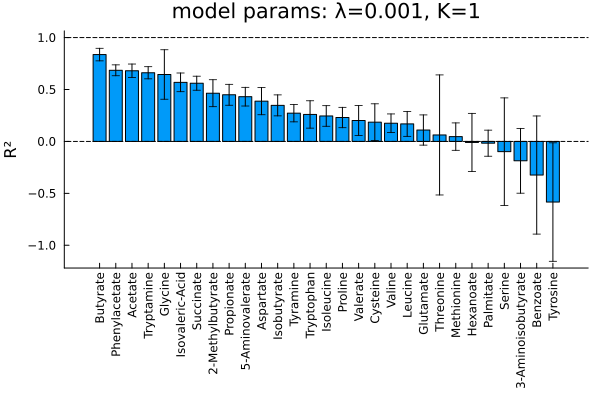

In [83]:
measure_pltdf = groupby(oof_preds_df_stacked, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df, 
        [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsquared,
    ) |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df,
        :rsquared => mean,
        :rsquared => std,
    ) |>
    df -> df[keepmetabolites_mask, :] |>
    df -> sort(df, :rsquared_mean, rev=true);

@df measure_pltdf bar(
    :metabolite_name, :rsquared_mean, yerror=:rsquared_std,
    xticks=((1:length(unique(:metabolite_name))).-.5, :metabolite_name),
    xrotation=90,
    label="",
    grid=false,
    bottommargin=10Plots.Measures.mm,
    title="model params: λ=$λ, K=$K",
    ylabel="R²",
)
hline!([0, 1], c=:black, label="", linestyle=:dash)

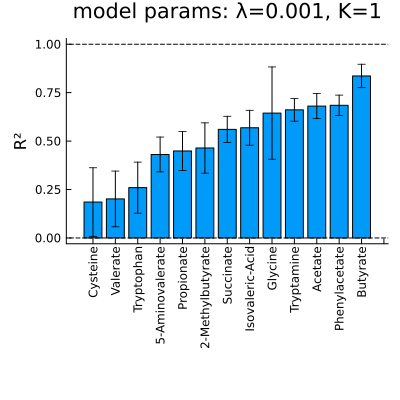

In [84]:
measure_pltdf = groupby(oof_preds_df_stacked, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df, 
        [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsquared,
    ) |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df,
        :rsquared => mean,
        :rsquared => std,
    ) |>
    df -> df[keepmetabolites_mask, :] |>
    df -> df[improvedmetabolite_mask, :] |>
    df -> sort(df, :rsquared_mean, rev=false);

@df measure_pltdf bar(
    :metabolite_name, :rsquared_mean, yerror=:rsquared_std,
    xticks=((1:sum(keepmetabolites_mask)).-.5, :metabolite_name),
    xrotation=90,
    label="",
    grid=false,
    bottommargin=10Plots.Measures.mm,
    title="model params: λ=$λ, K=$K",
    ylabel="R²",
    size=(400,400),
)
hline!([0, 1], c=:black, label="", linestyle=:dash)

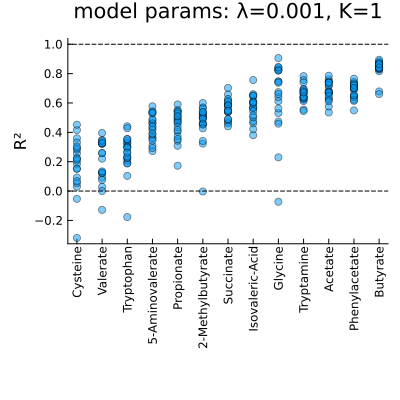

In [85]:
measure_pltdf = groupby(oof_preds_df_stacked, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df, 
        [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsquared,
    ) |>
    df -> groupby(df, :metabolite_name) |>
    df -> DataFrames.transform(df,
        :rsquared => mean,
    ) |>
    df -> subset(df, :metabolite_name => (x -> x .∈ Ref(improvedmetabolite_names)) ) |>
    df -> sort(df, :rsquared_mean)

@df measure_pltdf dotplot(string.(round.(:rsquared_mean, digits=5)), :rsquared, #yerror=:rsquared_std,
    xrotation=90,
    label="",
    grid=false,
    bottommargin=10Plots.Measures.mm,
    alpha=.5,
    mode=:none,
    xticks=((1:length(unique(:metabolite_name))) .- 0.5, unique(:metabolite_name)),
    title="model params: λ=$λ, K=$K",
    ylabel="R²",
    size=(400,400),    
)
hline!([0, 1], c=:black, label="", linestyle=:dash)

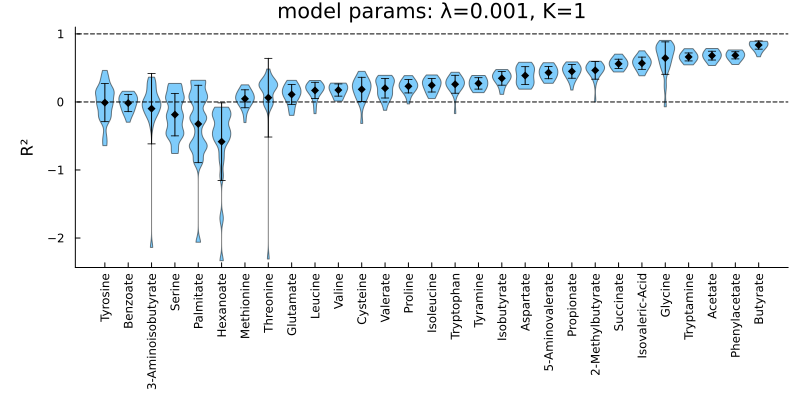

In [86]:
measure_pltdf = oof_preds_df_stacked |>
    df -> subset(df, :metabolite_name => (x -> x .∈ Ref(orderedmetabolites_names[keepmetabolites_mask])) ) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df, 
        [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsquared,
    ) |>
    df -> groupby(df, :metabolite_name) |>
    df -> DataFrames.transform(df,
        # :rsquared => (x->mean(filter(isfinite, x))) => :rsquared_mean,
        :rsquared => mean => :rsquared_mean,
    ) |>
    df -> sort(df, :rsquared_mean)

@df measure_pltdf violin(string.(round.(:rsquared_mean, digits=5)), :rsquared, #yerror=:rsquared_std,
    xrotation=90,
    label="",
    grid=false,
    bottommargin=15Plots.Measures.mm,
    leftmargin=7Plots.Measures.mm,
    alpha=.5,
    mode=:none,
    xticks=((1:length(unique(:metabolite_name))) .- 0.5, unique(:metabolite_name)),
    title="model params: λ=$λ, K=$K",
    ylabel="R²",
    size=(800,400),    
)

groupby(measure_pltdf, :metabolite_name) |>
    df->combine(df,
        :rsquared => mean,
        :rsquared => std) |>
    df -> @df df scatter!(
        string.(round.(:rsquared_mean, digits=5)), 
        :rsquared_mean, 
        yerror=:rsquared_std,
        markershape=:diamond,
        c=:black,
        label="",
        )

hline!([0, 1], c=:black, label="", linestyle=:dash)

In [87]:
savefig(joinpath(pdir, "rsquared_violin_of_allmetabolites_with10pctmeasurments.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/rsquared_violin_of_allmetabolites_with10pctmeasurments.pdf"

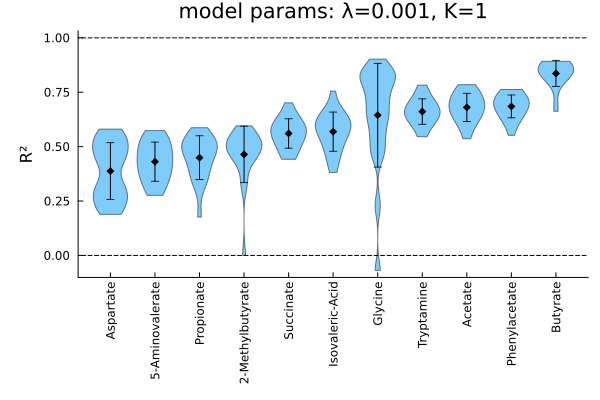

In [88]:
measure_pltdf = oof_preds_df_stacked |>
    df -> subset(df, :metabolite_name => (x -> x .∈ Ref(orderedmetabolites_names[keepmetabolites_mask])) ) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df, 
        [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsquared,
    ) |>
    df -> groupby(df, :metabolite_name) |>
    df -> DataFrames.transform(df,
        # :rsquared => (x->mean(filter(isfinite, x))) => :rsquared_mean,
        :rsquared => mean => :rsquared_mean,
        :rsquared => maximum => :rsquared_max,
    ) |>
    df -> subset(df, 
        :rsquared_max => (x -> x .> .5),
    ) |>
    df -> sort(df, :rsquared_mean)

@df measure_pltdf violin(string.(round.(:rsquared_mean, digits=3)), :rsquared, #yerror=:rsquared_std,
    xrotation=90,
    label="",
    grid=false,
    bottommargin=10Plots.Measures.mm,
    leftmargin=5Plots.Measures.mm,
    alpha=.5,
    mode=:none,
    xticks=((1:length(unique(:metabolite_name))) .- 0.5, unique(:metabolite_name)),
    title="model params: λ=$λ, K=$K",
    ylabel="R²",
    size=(600,400),    
)

groupby(measure_pltdf, :metabolite_name) |>
    df->combine(df,
        :rsquared => mean,
        :rsquared => std) |>
    df -> @df df scatter!(
        string.(round.(:rsquared_mean, digits=3)), 
        :rsquared_mean, 
        yerror=:rsquared_std,
        markershape=:diamond,
        c=:black,
        label="",
        )

hline!([0, 1], c=:black, label="", linestyle=:dash)

In [89]:
savefig(joinpath(pdir, "rsquared_violin_of_allmetabolites_with1foldgreaterthan1half.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/rsquared_violin_of_allmetabolites_with1foldgreaterthan1half.pdf"

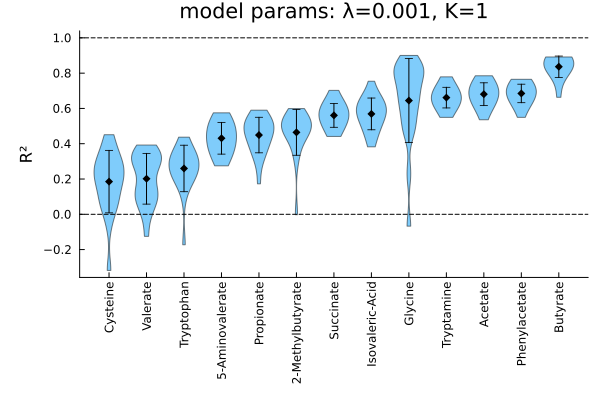

In [90]:
measure_pltdf = oof_preds_df_stacked |>
    df -> subset(df, :metabolite_name => (x -> x .∈ Ref(improvedmetabolite_names)) ) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df, 
        [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsquared,
    ) |>
    df -> groupby(df, :metabolite_name) |>
    df -> DataFrames.transform(df,
        # :rsquared => (x->mean(filter(isfinite, x))) => :rsquared_mean,
        :rsquared => mean => :rsquared_mean,
        :rsquared => maximum => :rsquared_max,
    ) |>
    df -> sort(df, :rsquared_mean)

@df measure_pltdf violin(string.(round.(:rsquared_mean, digits=5)), :rsquared, #yerror=:rsquared_std,
    xrotation=90,
    label="",
    grid=false,
    bottommargin=10Plots.Measures.mm,
    leftmargin=5Plots.Measures.mm,
    alpha=.5,
    mode=:none,
    xticks=((1:length(unique(:metabolite_name))) .- 0.5, unique(:metabolite_name)),
    title="model params: λ=$λ, K=$K",
    ylabel="R²",
    size=(600,400),    
)

groupby(measure_pltdf, :metabolite_name) |>
    df->combine(df,
        :rsquared => mean,
        :rsquared => std) |>
    df -> @df df scatter!(
        string.(round.(:rsquared_mean, digits=5)), 
        :rsquared_mean, 
        yerror=:rsquared_std,
        markershape=:diamond,
        c=:black,
        label="",
        )

hline!([0, 1], c=:black, label="", linestyle=:dash)

In [91]:
savefig(joinpath(pdir, "rsquared_violin_of_improvedmetabolites.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/rsquared_violin_of_improvedmetabolites.pdf"

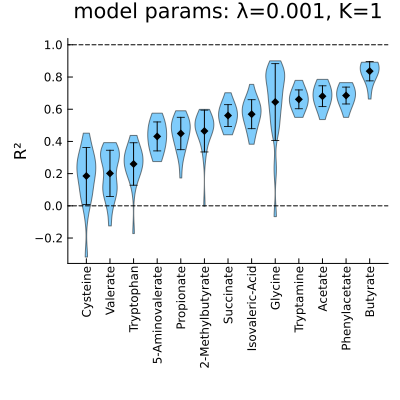

In [92]:
measure_pltdf = groupby(oof_preds_df_stacked, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df, 
        [:preds, :truth] => ((yhat, y) -> rsquared(yhat, y)) => :rsquared,
    ) |>
    df -> groupby(df, :metabolite_name) |>
    df -> DataFrames.transform(df,
        :rsquared => mean,
    ) |>
    df -> subset(df, :metabolite_name => (x -> x .∈ Ref(improvedmetabolite_names)) ) |>
    df -> sort(df, :rsquared_mean)

@df measure_pltdf violin(string.(round.(:rsquared_mean, digits=5)), :rsquared, #yerror=:rsquared_std,
    xrotation=90,
    label="",
    grid=false,
    bottommargin=5Plots.Measures.mm,
    alpha=.5,
    mode=:none,
    xticks=((1:length(unique(:metabolite_name))) .- 0.5, unique(:metabolite_name)),
    title="model params: λ=$λ, K=$K",
    ylabel="R²",
    size=(400,400),    
)

groupby(measure_pltdf, :metabolite_name) |>
    df->combine(df,
        :rsquared => mean,
        :rsquared => std) |>
    df -> @df df scatter!(
        string.(round.(:rsquared_mean, digits=5)), 
        :rsquared_mean, 
        yerror=:rsquared_std,
        markershape=:diamond,
        c=:black,
        label="",
        )

hline!([0, 1], c=:black, label="", linestyle=:dash)

In [93]:
savefig(joinpath(pdir, "rsquared_violin_of_improvedmetabolites_smallsize.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/rsquared_violin_of_improvedmetabolites_smallsize.pdf"

In [94]:
coefdf_avgbytreedist = groupby(coefdf, [:metabolite_name, :treedist]) |>
    df -> combine(df, 
        :coef => (x-> mean(x) - 1std(x)) => :coef_lowerbound,
        :coef => (x-> mean(x) + 1std(x)) => :coef_upperbound,
        :coef => (x-> mean(x)) => :coef_mean,
        :coef => (x-> mean(abs.(x))) => :coef_meanabs,
        :coef => (x-> median(x)) => :coef_median,
        :coef => (x-> quantile(x, 0.25)) => :coef_Q2,
        :coef => (x-> quantile(x, 0.75)) => :coef_Q3,
        nrow
    ) |>
    df -> DataFrames.transform(df,
        [:coef_lowerbound, :coef_upperbound] => ((lo, hi) -> lo .> 0 .|| hi .< 0) => :isnonzero,
    );

In [95]:
predictable_metabolite_idx = indexin(improvedmetabolite_names, orderedmetabolites_names);

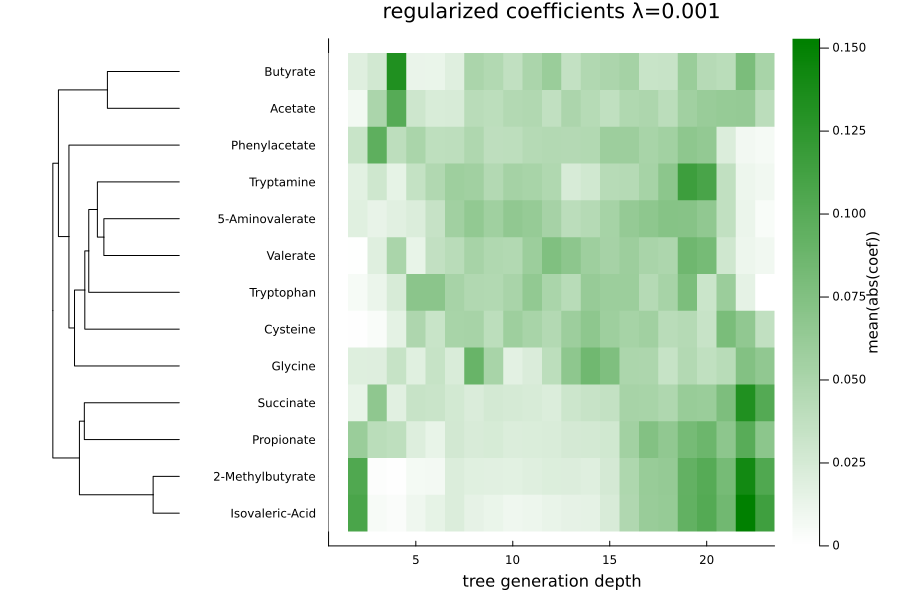

In [96]:
coef_mtxdf = unstack(coefdf_avgbytreedist, :metabolite_name, :treedist, :coef_meanabs) |>
    df -> df[indexin(orderedmetabolites_names, df.metabolite_name), :] |>
    df -> df[reverse(predictable_metabolite_idx), :] #|> 
coefmtx = Matrix(coef_mtxdf[:, 2:end])
coefmtx = coefmtx ./ sum(coefmtx, dims=2)
pltmtx = coefmtx

rowhc = hclust(pairwise(Euclidean(), coefmtx, dims=1), branchorder=:optimal);
roworder = rowhc.order #sortperm(vec(sum(abs.(coefmtx), dims=2)), rev=true)
# pltmtx = abs.(coefmtx)
# rownames = coef_mtxdf.metabolite_name
pltmtx = abs.(pltmtx[roworder, :])
rownames = coef_mtxdf.metabolite_name[roworder]

tplot = plot(
    # readnw(SPI.nwstr(rowhc, String.(coef_mtxdf.metabolite_name), labelinternalnodes=false)), 
    readnw(SPI.nwstr(rowhc, repeat([""], length(rowhc.order)), labelinternalnodes=false)), 
    fs=1
)

hplot = heatmap(pltmtx,
    title="regularized coefficients λ=$λ",
    yticks=(1:size(coefmtx, 1), rownames),
    # xticks=(2:2:10, (2:2:10) .* 10),
    # clims = extrema(coefmtx) |> x->abs.(x) |> maximum |> x->(-x, x),
    colorbartitle="mean(abs(coef))",
    xlabel="tree generation depth",
    c=[:white, :green],
    size=(900, 600),
    margin=3Plots.Measures.mm,
)

layout = @layout [a{.2w} b]
plot(tplot, hplot, link=:y, layout=layout)

In [97]:
savefig(joinpath(pdir, "Coeff_heatmap_clusteredimprovedmetabolites.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/Coeff_heatmap_clusteredimprovedmetabolites.pdf"

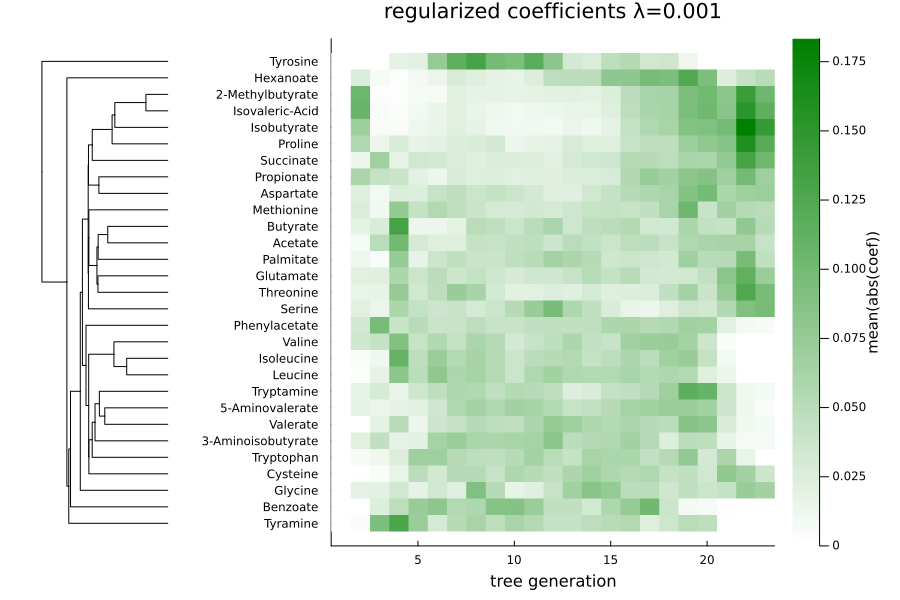

In [114]:
coef_mtxdf = unstack(coefdf_avgbytreedist, :metabolite_name, :treedist, :coef_meanabs) |>
    df -> df[indexin(orderedmetabolites_names, df.metabolite_name), :] |>
    df -> df[keepmetabolites_mask, :] #|> 
coefmtx = Matrix(coef_mtxdf[:, 2:end])
coefmtx = coefmtx ./ sum(coefmtx, dims=2)
pltmtx = coefmtx

rowhc = hclust(pairwise(Euclidean(), coefmtx, dims=1), branchorder=:optimal);
roworder = rowhc.order #sortperm(vec(sum(abs.(coefmtx), dims=2)), rev=true)
# pltmtx = abs.(coefmtx)
# rownames = coef_mtxdf.metabolite_name
pltmtx = abs.(pltmtx[roworder, :])
rownames = coef_mtxdf.metabolite_name[roworder]

tplot = plot(
    # readnw(SPI.nwstr(rowhc, String.(coef_mtxdf.metabolite_name), labelinternalnodes=false)), 
    readnw(SPI.nwstr(rowhc, repeat([""], length(rowhc.order)), labelinternalnodes=false)), 
    fs=1
)

hplot = heatmap(pltmtx,
    title="regularized coefficients λ=$λ",
    yticks=(1:size(coefmtx, 1), rownames),
    # xticks=(2:2:10, (2:2:10) .* 10),
    # clims = extrema(coefmtx) |> x->abs.(x) |> maximum |> x->(-x, x),
    colorbartitle="mean(abs(coef))",
    xlabel="tree generation",
    c=[:white, :green],
    size=(900, 600),
    margin=3Plots.Measures.mm,
)

layout = @layout [a{.2w} b]
plot(tplot, hplot, link=:y, layout=layout)

In [115]:
savefig(joinpath(pdir, "Coeff_heatmap_clusteredmetabolites_greaterthan10pctmeasurements.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/Coeff_heatmap_clusteredmetabolites_greaterthan10pctmeasurements.pdf"

In [100]:
metabolite_name = "Acetate"
# metabolite_name = "Phenylacetate"

"Acetate"

In [101]:
# predsdf = filter(:metabolite_name => ==(metabolite_name), oof_preds_df_stacked) |>
#     df -> groupby(df, :row_id) |>
#     df -> combine(df, 
#         :metabolite_name => first => :metabolite_name,
#         :truth => first => :truth,
#         :preds => mean,
#         :preds => std,
#     )

In [24]:
λ

0.001

In [103]:
for r in 1:5
    predsdf = filter(:metabolite_name => ==(metabolite_name), oof_preds_df_stacked) |>
        df -> subset(df, :resample => x-> x.==r) |>
        df -> sort(df, :row_id)

    lims = extrema(vcat(predsdf.preds, predsdf.truth))
    lims =  lims .+ (-(lims[2] - lims[1]) * 0.1, (lims[2] - lims[1]) * 0.1)
    plot(identity, -20, 20, c=:black, lw=.5, label="")
    p1 = @df predsdf scatter!(:preds, :truth,
        group=trnYdf.species[:row_id],
        lims=lims,
        title="SPI LASSO (λ=$λ, K=1, resmp=$r)",
        ylabel=metabolite_name * " (truth)",
        xlabel=metabolite_name * " (prediction)",
        grid=false,
        markerstrokewidth=0,
        ratio=1,
        c=speciescolors_ordered,
        size=(900,600),
        legend=:outerright,
        xrotation=90,
        alpha=.5,
        margin=5Plots.Measures.mm,

    )
    savefig(joinpath(pdir, "$(metabolite_name)_resample$(r)_scatter_preds_vs_truth.pdf"))
end

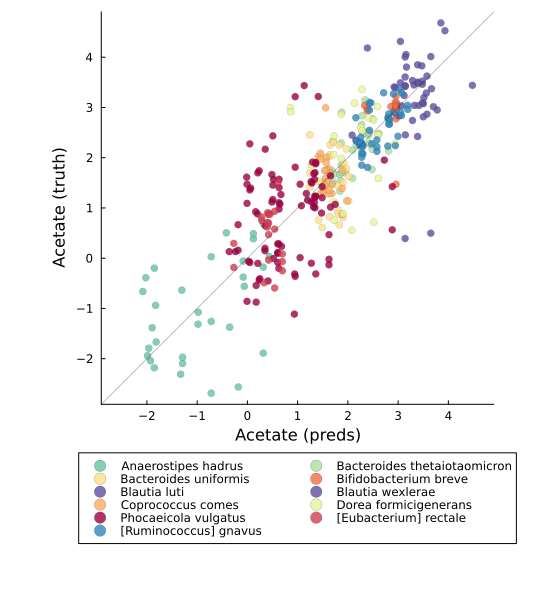

In [104]:
r = 5
predsdf = filter(:metabolite_name => ==(metabolite_name), oof_preds_df_stacked) |>
    df -> filter(:resample => ==(r), df)
@df predsdf scatter(
    :preds, :truth,
    group=trnYdf.species[:row_id],
    c=speciescolors_ordered,
    lims=extrema(vcat(:preds, :truth)),
    widen=true,
    ratio=1,
    size=(550,600),
    legend=:outerbottom,
    legend_column=2,
    markerstrokewidth=.1,
    alpha=.8,
    xlabel="$metabolite_name (preds)",
    ylabel="$metabolite_name (truth)",
)
plot!(identity, -20, 20, c=:black, alpha=.5, lw=0.5)

## Lasso model predictions

In [256]:
truth_oof_stacked = stack(lasso_oof_preds_df, r".*_true") |>
    df->select(df, 
        :row_id, 
        :variable => ((x)-> String.(first.(split.(x, "_")))) => :metabolite_name,
        :fold, 
        :value => :truth
    ) |>
    df -> filter(:metabolite_name => m-> m.∈Ref(orderedmetabolites_names), df);

fulllasso_oofpreds_stacked = stack(lasso_oof_preds_df, r".*pred_full") |>
    df->select(df, 
        :row_id, 
        :variable => ((x)-> String.(first.(split.(x, "_")))) => :metabolite_name,
        :fold, 
        :value => :pred_full
    ) |>
    df -> filter(:metabolite_name => m-> m.∈Ref(orderedmetabolites_names), df);

top10_oofpreds_stacked = stack(lasso_oof_preds_df, r".*pred_top10") |>
    df->select(df, 
        :row_id, 
        :variable => ((x)-> String.(first.(split.(x, "_")))) => :metabolite_name,
        :fold, 
        :value => :pred_top10
    ) |>
    df -> filter(:metabolite_name => m-> m.∈Ref(orderedmetabolites_names), df);

top3_oofpreds_stacked = stack(lasso_oof_preds_df, r".*pred_top3") |>
    df->select(df, 
        :row_id, 
        :variable => ((x)-> String.(first.(split.(x, "_")))) => :metabolite_name,
        :fold, 
        :value => :pred_top3
    ) |>
    df -> filter(:metabolite_name => m-> m.∈Ref(orderedmetabolites_names), df);

In [257]:
lasso_oof_preds_df_stacked = truth_oof_stacked
for preddf in [fulllasso_oofpreds_stacked, top10_oofpreds_stacked, top3_oofpreds_stacked]
    lasso_oof_preds_df_stacked = leftjoin(lasso_oof_preds_df_stacked, preddf, on=[:row_id, :metabolite_name], makeunique=true)
end

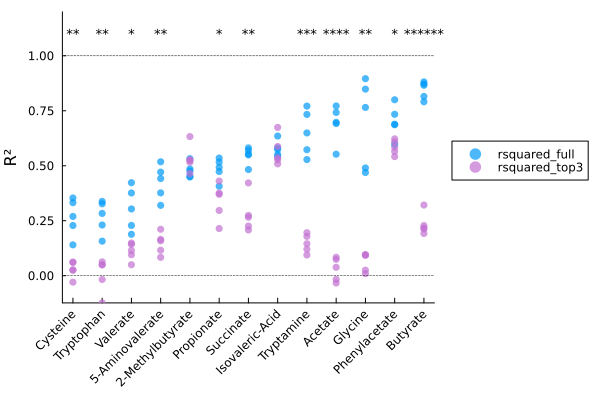

In [107]:
pltdf = lasso_oof_preds_df_stacked |>
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold]) |>
    df -> combine(df,
    [:pred_full, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_full, 
    [:pred_top3, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_top3, 
    ) |>
    df -> groupby(df, [:metabolite_name]) |>
    df -> DataFrames.transform(df, 
        :rsquared_full => mean, 
        :rsquared_top3 => mean, 
    ) |>
    df -> stack(df, 3:4) |>
    df -> sort(df, :rsquared_full_mean)

sigresults = pltdf |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df,
        :rsquared_full_mean => first => :rsquared_full_mean,
        [:variable, :value] => ((grp, rsqval) -> 
            pvalue(UnequalVarianceTTest(rsqval[grp.=="rsquared_full"], rsqval[grp.=="rsquared_top3"]))) => :pval
    ) |>
    df -> DataFrames.transform(df, :pval => (p->adjust(p, BenjaminiHochberg())) => :pval_bh) |>
    df -> DataFrames.transform(df, :pval_bh => (p->floor.(Int, log10.(1 ./ p))) => :poweroftest)

plot(
    ylabel="R²",
    bottommargin=7Plots.Measures.mm,
    xrotation=45,
    legend=:outerright)
@df pltdf dotplot!(
    string.(round.(:rsquared_full_mean, digits=6)), :value,
    group=:variable,
    mode=:none,
    side=[:left :right],
    alpha=.7,
    markerstrokewidth=0,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),
    ylims=(-Inf, 1.2),
    # label="Full lasso",
    c=[1 4],
)
hline!([0,1], c=:black, lw=.5, linestyle=:dash, legend=:outerright)
@df sigresults annotate!(
    string.(round.(:rsquared_full_mean, digits=6)), 
    ones(nrow(sigresults)) .+ 0.1,
    text.(
        repeat.("*", :poweroftest),
        9, :center,
    )
)

In [108]:
savefig(joinpath(pdir, "improvedmetabolites_full-vs-top3_dotplot.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/improvedmetabolites_full-vs-top3_dotplot.pdf"

In [258]:
sbalassopltdf = oof_preds_df_stacked |> #filter(:resample => ==(1), oof_preds_df_stacked) |>
    df -> rename(df, :preds => :preds_SBA) |>
    df -> select(df, [:row_id, :metabolite_name, :fold, :resample, :truth, :preds_SBA]) |>
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df,
        [:preds_SBA, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_SBA, 
    ) |>
    df -> groupby(df, [:metabolite_name]) |>
    df -> DataFrames.transform(df, 
        :rsquared_SBA => mean,
        [:fold, :resample] => ((x, y) -> x.*y) => :fold_iter,
    ) |>
    df -> stack(df, :rsquared_SBA) 

top3lassopltdf = lasso_oof_preds_df_stacked |>
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold]) |>
    df -> combine(df,
    [:pred_top3, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_top3, 
    ) |>
    df -> stack(df, :rsquared_top3)
top3lassopltdf[!,:rsquared_SBA_mean] .= sbalassopltdf.rsquared_SBA_mean[indexin(top3lassopltdf.metabolite_name, sbalassopltdf.metabolite_name)]

pltdf = vcat(select(sbalassopltdf, [:metabolite_name, :rsquared_SBA_mean, :variable, :value]),
    select(top3lassopltdf, [:metabolite_name, :rsquared_SBA_mean, :variable, :value])) |>
    df -> sort(df, :rsquared_SBA_mean)

sigresults = pltdf |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df,
        :rsquared_SBA_mean => first => :rsquared_SBA_mean,
        [:variable, :value] => ((grp, rsqval) -> 
            pvalue(UnequalVarianceTTest(rsqval[grp.=="rsquared_SBA"], rsqval[grp.=="rsquared_top3"]))) => :pval
    ) |>
    df -> DataFrames.transform(df, :pval => (p->adjust(p, BenjaminiHochberg())) => :pval_bh) |>
    df -> DataFrames.transform(df, :pval_bh => (p->floor.(Int, log10.(1 ./ p))) => :poweroftest);

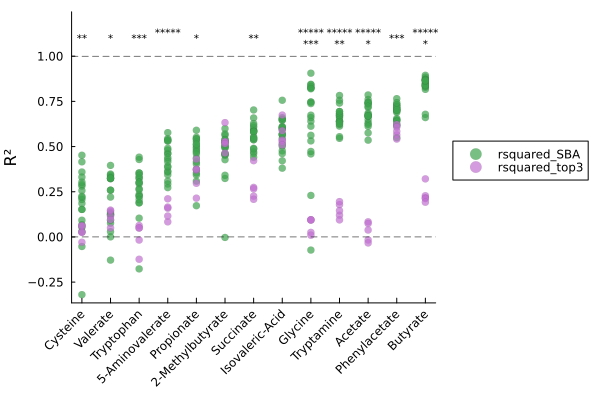

In [259]:
plot(
    ylabel="R²",
    bottommargin=7Plots.Measures.mm,
    xrotation=45,
    legend=:outerright)
@df pltdf dotplot!(
    string.(round.(:rsquared_SBA_mean, digits=6)), :value,
    group=:variable,
    mode=:none,
    side=[:left :right],
    alpha=.7,
    markerstrokewidth=0,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),
    ylims=(-Inf, 1.2),
    widen=true,
    # label="Full lasso",
    c=[3 4],
)
hline!([0,1], c=:black, lw=.5, linestyle=:dash, legend=:outerright)
@df sigresults annotate!(
    string.(round.(:rsquared_SBA_mean, digits=6)), 
    ones(nrow(sigresults)) .+ 0.1,
    text.(
        replace.(repeat.("*", :poweroftest), r"(.{5})"=>s"\1\n"),
        # "1e-" .* string.(:poweroftest),
        7, :center,
    )
)

In [111]:
savefig(joinpath(pdir, "improvedmetabolites_sba-vs-top3_dotplot.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/improvedmetabolites_sba-vs-top3_dotplot.pdf"

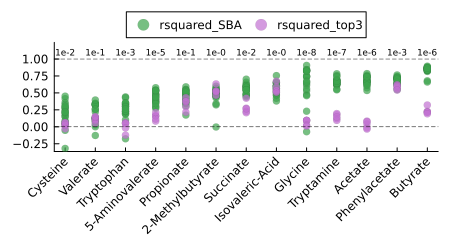

In [164]:
plot(
    # ylabel="R²",
    bottommargin=10Plots.Measures.mm,
    xrotation=45,
    legend=:outertop,
    legendcolumns=2)
@df pltdf dotplot!(
    string.(round.(:rsquared_SBA_mean, digits=6)), :value,
    group=:variable,
    mode=:none,
    alpha=.7,
    markerstrokewidth=0,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),
    ylims=(-Inf, 1.2),
    widen=true,
    size=(450, 250),
    # label="Full lasso",
    c=[3 4],
)
hline!([0,1], c=:black, lw=.5, linestyle=:dash)
@df sigresults annotate!(
    string.(round.(:rsquared_SBA_mean, digits=6)), 
    ones(nrow(sigresults)) .+ 0.1,
    text.(
        # replace.(repeat.("*", :poweroftest), r"(.{5})"=>s"\1\n"),
        "1e-" .* string.(:poweroftest),
        6, :center,
    )
)

In [ ]:
savefig(joinpath(pdir, "improvedmetabolites_sba-vs-top3_dotplot_sigorder.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/improvedmetabolites_sba-vs-top3_dotplot_sigorder.pdf"

In [267]:
improvedmetabolite_names

13-element Vector{String31}:
 "Propionate"
 "Succinate"
 "Tryptamine"
 "Glycine"
 "Butyrate"
 "Acetate"
 "Valerate"
 "Cysteine"
 "Tryptophan"
 "5-Aminovalerate"
 "Phenylacetate"
 "2-Methylbutyrate"
 "Isovaleric-Acid"

In [260]:
sbalassopltdf = oof_preds_df_stacked |> #filter(:resample => ==(1), oof_preds_df_stacked) |>
    df -> rename(df, :preds => :preds_SBA) |>
    df -> select(df, [:row_id, :metabolite_name, :fold, :resample, :truth, :preds_SBA]) |>
    df -> filter(:metabolite_name => !∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df,
        [:preds_SBA, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_SBA, 
    ) |>
    df -> groupby(df, [:metabolite_name]) |>
    df -> DataFrames.transform(df, 
        :rsquared_SBA => mean,
        [:fold, :resample] => ((x, y) -> x.*y) => :fold_iter,
    ) |>
    df -> stack(df, :rsquared_SBA) 

# top3lassopltdf = lasso_oof_preds_df_stacked |>
#     df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
#     df -> groupby(df, [:metabolite_name, :fold]) |>
#     df -> combine(df,
#     [:pred_top3, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_top3, 
#     ) |>
#     df -> stack(df, :rsquared_top3)
# top3lassopltdf[!,:rsquared_SBA_mean] .= sbalassopltdf.rsquared_SBA_mean[indexin(top3lassopltdf.metabolite_name, sbalassopltdf.metabolite_name)]

pltdf = select(sbalassopltdf, [:metabolite_name, :rsquared_SBA_mean, :variable, :value]) |>
    df -> sort(df, :rsquared_SBA_mean)

# sigresults = pltdf |>
#     df -> groupby(df, :metabolite_name) |>
#     df -> combine(df,
#         :rsquared_SBA_mean => first => :rsquared_SBA_mean,
#         [:variable, :value] => ((grp, rsqval) -> 
#             pvalue(UnequalVarianceTTest(rsqval[grp.=="rsquared_SBA"], rsqval[grp.=="rsquared_top3"]))) => :pval
#     ) |>
#     df -> DataFrames.transform(df, :pval => (p->adjust(p, BenjaminiHochberg())) => :pval_bh) |>
#     df -> DataFrames.transform(df, :pval_bh => (p->floor.(Int, log10.(1 ./ p))) => :poweroftest);

Row,metabolite_name,rsquared_SBA_mean,variable,value
,String31,Float64,String,Float64
1,4-Methylvalerate,-Inf,rsquared_SBA,-0.173998
2,4-Methylvalerate,-Inf,rsquared_SBA,-0.723425
3,4-Methylvalerate,-Inf,rsquared_SBA,-Inf
4,4-Methylvalerate,-Inf,rsquared_SBA,-1.41554
5,4-Methylvalerate,-Inf,rsquared_SBA,-Inf
6,4-Methylvalerate,-Inf,rsquared_SBA,-0.405852
7,4-Methylvalerate,-Inf,rsquared_SBA,-2.80455
8,4-Methylvalerate,-Inf,rsquared_SBA,-0.0433674
9,4-Methylvalerate,-Inf,rsquared_SBA,-4.03616


In [270]:
pltdf[pltdf.value .< -11, :]

Row,metabolite_name,rsquared_SBA_mean,variable,value
,String31,Float64,String,Float64
1,4-Methylvalerate,-Inf,rsquared_SBA,-Inf
2,4-Methylvalerate,-Inf,rsquared_SBA,-Inf
3,4-Methylvalerate,-Inf,rsquared_SBA,-Inf
4,Desaminotyrosine,-24.7032,rsquared_SBA,-476.958


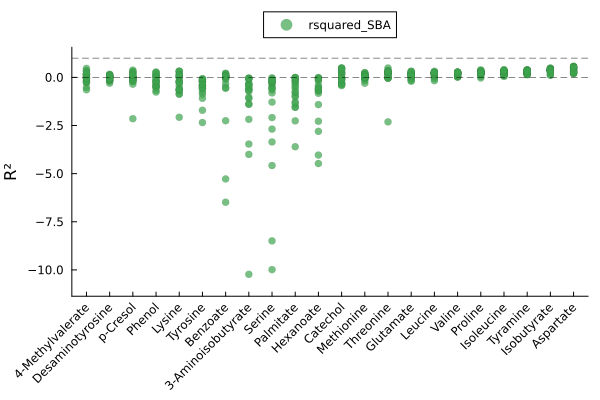

In [273]:
plot(
    ylabel="R²",
    bottommargin=7Plots.Measures.mm,
    xrotation=45,
    legend=:outerright)
@df pltdf dotplot!(
    string.(round.(:rsquared_SBA_mean, digits=6)), :value,
    group=:variable,
    mode=:none,
    side=[:left :right],
    alpha=.7,
    markerstrokewidth=0,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),
    ylims=(-11, 1.2),
    widen=true,
    # label="Full lasso",
    c=[3 4],
)
hline!([0,1], c=:black, lw=.5, linestyle=:dash, legend=:outertop)
# @df sigresults annotate!(
#     string.(round.(:rsquared_SBA_mean, digits=6)), 
#     ones(nrow(sigresults)) .+ 0.1,
#     text.(
#         replace.(repeat.("*", :poweroftest), r"(.{5})"=>s"\1\n"),
#         # "1e-" .* string.(:poweroftest),
#         7, :center,
#     )
# )

In [276]:
savefig(joinpath(pdir, "SLE_Rsqr_lessthan50pct_dotplot.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/SLE_Rsqr_lessthan50pct_dotplot.pdf"

In [195]:
sbalassopltdf = oof_preds_df_stacked |> #filter(:resample => ==(1), oof_preds_df_stacked) |>
    df -> rename(df, :preds => :preds_SBA) |>
    df -> select(df, [:row_id, :metabolite_name, :fold, :resample, :truth, :preds_SBA]) |>
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df,
        [:preds_SBA, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_SBA, 
    ) |>
    df -> groupby(df, [:metabolite_name]) |>
    df -> DataFrames.transform(df, 
        :rsquared_SBA => mean,
        [:fold, :resample] => ((x, y) -> x.*y) => :fold_iter,
    ) |>
    df -> stack(df, :rsquared_SBA) 

ogglassopltdf = oof_preds_df_stacked_ogg |> #filter(:resample => ==(1), oof_preds_df_stacked) |>
    df -> rename(df, :preds => :preds_ogg) |>
    df -> select(df, [:row_id, :metabolite_name, :fold, :resample, :truth, :preds_ogg]) |>
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df,
        [:preds_ogg, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_ogg, 
    ) |>
    df -> groupby(df, [:metabolite_name]) |>
    df -> DataFrames.transform(df, 
        :rsquared_ogg => mean,
        [:fold, :resample] => ((x, y) -> x.*y) => :fold_iter,
    ) |>
    df -> stack(df, :rsquared_ogg) 
ogglassopltdf[!,:rsquared_SBA_mean] .= sbalassopltdf.rsquared_SBA_mean[indexin(ogglassopltdf.metabolite_name, sbalassopltdf.metabolite_name)]

pltdf = vcat(select(sbalassopltdf, [:metabolite_name, :rsquared_SBA_mean, :variable, :value]),
             select(ogglassopltdf, [:metabolite_name, :rsquared_SBA_mean, :variable, :value])) |>
    df -> sort(df, :rsquared_SBA_mean)

sigresults = pltdf |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df,
        :rsquared_SBA_mean => first => :rsquared_SBA_mean,
        [:variable, :value] => ((grp, rsqval) -> 
            #     MannWhitneyUTest() UnequalVarianceTTest()
            pvalue(UnequalVarianceTTest(rsqval[grp.=="rsquared_SBA"], rsqval[grp.=="rsquared_ogg"]), tail=:right)) => :pval
    ) |> 
    df -> DataFrames.transform(df, :pval => (p->adjust(p, BenjaminiHochberg())) => :pval_bh) |>
    df -> DataFrames.transform(df, :pval_bh => (p->floor.(Int, log10.(1 ./ p))) => :poweroftest);


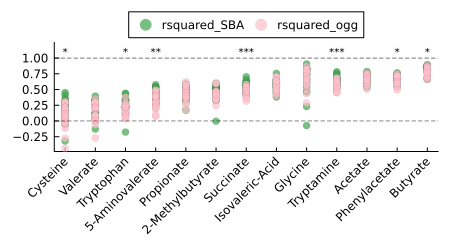

In [196]:
plot(
    # ylabel="R²",
    bottommargin=10Plots.Measures.mm,
    xrotation=45,
    legend=:outertop,
    legendcolumns=2,)
@df pltdf dotplot!(
    string.(round.(:rsquared_SBA_mean, digits=6)), :value,
    group=:variable,
    mode=:none,
    alpha=.7,
    markerstrokewidth=0,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),
    ylims=(-Inf, 1.2),
    widen=true,
    size=(450, 250),
    # label="Full lasso",
    c=[3 :pink],
)
hline!([0,1], c=:black, lw=.5, linestyle=:dash)
@df sigresults annotate!(
    string.(round.(:rsquared_SBA_mean, digits=6)), 
    ones(nrow(sigresults)) .+ 0.1,
    text.(
        replace.(repeat.("*", :poweroftest), r"(.{5})"=>s"\1\n"),
        # "1e-" .* string.(:poweroftest),
        7, :center,
    )
)

In [158]:
savefig(joinpath(pdir, "improvedmetabolites_sba-vs-ogg_dotplot.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/improvedmetabolites_sba-vs-ogg_dotplot.pdf"

In [143]:
bbobs_trn[treeorder[[1,2, 354, 355,356]], :]
# bbobs_trn[treeorder, :]

Row,ID,unique_id,phylum,class,order,family,genus,species,donor,inBB673,species_donor
,String,String,String,String,String,String,String,String,String,Int8,String
1,DFI.1.247,DFI.1.247 Bacteroides uniformis,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides uniformis,1,1,Bacteroides uniformis_1
2,DFI.1.135,DFI.1.135 Bacteroides uniformis,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides uniformis,1,1,Bacteroides uniformis_1
3,MSK.15.40,MSK.15.40 Anaerostipes hadrus,Firmicutes,Clostridia,Eubacteriales,Lachnospiraceae,Anaerostipes,Anaerostipes hadrus,15,1,Anaerostipes hadrus_15
4,MSK.18.5,MSK.18.5 Blautia luti,Firmicutes,Clostridia,Eubacteriales,Lachnospiraceae,Blautia,Blautia luti,18,1,Blautia luti_18
5,MSK.14.58,MSK.14.58 Blautia glucerasea,Firmicutes,Clostridia,Eubacteriales,Lachnospiraceae,Blautia,Blautia luti,14,1,Blautia luti_14


In [144]:
biobank["metabolites_foldchange"].X[:,:][full_train_mask, 1][treeorder[[1,2, 354,355,356]]] |>
    x-> round.(x, digits=3)

5-element Vector{Float64}:
  1.861
  1.346
 -1.89
  2.45
  2.348

In [102]:
filter(:resample => ==(4), oof_preds_df_stacked_ogg)

Row,row_id,metabolite_name,fold,resample,truth,preds
,Int64,String31,Int64,Int64,Float64,Float64
1,223,Propionate,1,4,-0.543002,-1.54541
2,256,Propionate,1,4,1.72518,0.687524
3,27,Propionate,1,4,-0.285653,-1.19177
4,233,Propionate,1,4,4.66714,3.77358
5,199,Propionate,1,4,1.52881,1.55584
6,116,Propionate,1,4,0.500143,-0.00866779
7,342,Propionate,1,4,0.0934784,1.00102
8,182,Propionate,1,4,4.48903,-1.75897
9,304,Propionate,1,4,3.39343,2.80704


## Plot OGG predictions vs SLE predictions

In [27]:
oof_preds_SLE_lassos = leftjoin(filter(:resample => ==(4), oof_preds_df_stacked), fulllasso_oofpreds_stacked,
        on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> leftjoin(df, top3_oofpreds_stacked, on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> leftjoin(df, filter(:resample => ==(4), oof_preds_df_stacked_ogg), on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> select(df,
        :row_id,
        :metabolite_name,
        :truth,
        :preds => :preds_SLE,
        :preds_1 => :preds_ogg,
        :pred_full => :preds_full,
        :pred_top3 => :preds_top3,
    );

In [28]:
r = 4
predsdf = filter(:metabolite_name => ==(metabolite_name), oof_preds_df_stacked) |>
    df -> filter(:resample => ==(r), df)
@df predsdf scatter(
    :preds, :truth,
    group=trnYdf.species[:row_id],
    c=speciescolors_ordered,
    lims=extrema(vcat(:preds, :truth)),
    widen=true,
    ratio=1,
    size=(550,600),
    legend=:outerbottom,
    legend_column=2,
    markerstrokewidth=.1,
    alpha=.8,
    title="SLE LASSO λ=$λ",
    xlabel="$metabolite_name (preds)",
    ylabel="$metabolite_name (truth)",
)
plot!(identity, -20, 20, c=:black, alpha=.5, lw=0.5)

UndefVarError: UndefVarError: metabolite_name not defined

In [29]:
sorted_improvedmetabolite_names = [
    "Butyrate",
    "Phenylacetate",
    "Acetate",
    "Tryptamine",
    "Glycine",
    "Isovaleric-Acid",
    "Succinate",
    "2-Methylbutyrate",
    "Propionate",
    "5-Aminovalerate",
    "Tryptophan",
    "Valerate",
    "Cysteine",
];

In [33]:
ps = []
for mname in sorted_improvedmetabolite_names
    pltdf = filter(:metabolite_name => ==(mname), oof_preds_SLE_lassos)
    p = plot(identity, -20, 20, c=:black, alpha=.5, lw=0.5)
    p = @df pltdf scatter!(:preds_SLE, :preds_ogg,
        group=trnYdf.species[:row_id],
        c=speciescolors_ordered,
        lims=extrema(vcat(:preds_SLE, :preds_ogg)),
        widen=true,
        ratio=1, legend=:none,
        markerstrokewidth=0.0,
        alpha=.5,
        xrotation=45,
        title=mname,
        # xlabel="$mname (SLE)",
        # ylabel="$mname (full)",
        tickdirection=:none,
        framestyle=:box,
        framelinewidth=0.5,
    )
    push!(ps, p)
end

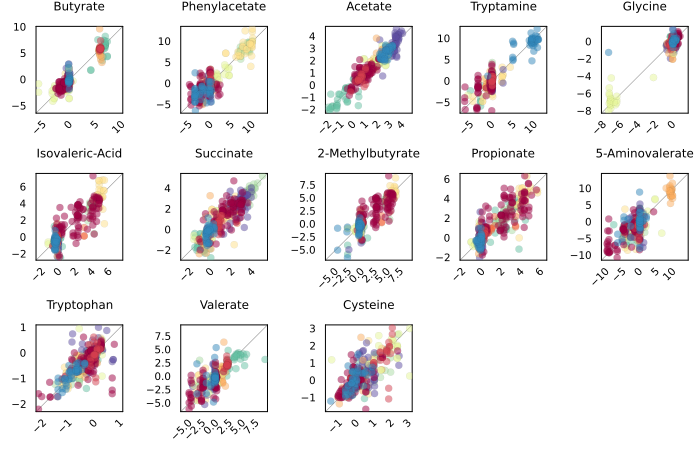

In [34]:
plot(ps..., layout=grid(3,5), titlefontsize=8, labelfontsize=6, tickfontsize=7, size=(700,450))

In [35]:
savefig(joinpath(pdir, "improvedmetabolites_SLEpreds-vs-OGGPreds.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/improvedmetabolites_SLEpreds-vs-OGGPreds.pdf"

In [37]:
bbmtx_trn

356×5449 Matrix{Int64}:
 0  1  0  0  0  0  1  1  0  1  0  0  0  …  0  0  1  0  0  2  1  0  0  0  0  0
 1  0  0  0  0  0  1  2  0  1  0  0  0     0  0  0  0  0  0  1  0  0  0  0  0
 0  0  0  0  0  0  1  1  0  1  0  0  0     0  0  0  0  0  0  1  0  0  0  0  0
 0  0  0  0  0  0  1  1  0  1  0  0  0     0  0  0  0  0  2  1  0  0  0  0  0
 0  0  0  0  0  0  1  1  0  1  0  0  0     0  0  0  0  0  1  1  0  0  0  0  0
 0  0  0  0  0  0  1  1  0  1  0  1  0  …  0  0  0  0  0  0  1  0  0  0  0  0
 0  0  0  0  0  0  0  0  2  0  0  0  0     0  0  0  0  1  1  0  0  1  0  0  0
 0  0  0  0  0  0  0  0  2  0  0  0  0     0  0  0  0  1  1  0  0  1  0  0  0
 0  0  0  0  1  0  0  0  1  0  0  0  0     0  0  0  0  1  0  0  0  1  0  0  0
 0  0  0  0  1  0  0  0  3  0  0  0  0     0  0  0  0  1  0  0  0  1  0  1  0
 ⋮              ⋮              ⋮        ⋱           ⋮              ⋮        
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  1  0  3  0  0  1
 0  0  0  0  1  0  0  0  0  0  0  0  0   

## Plot Hadrus tree with metabolite truth & predictions

In [117]:
treeorder = indexin(getleafnames(subsettree), bbobs_trn.ID);

In [118]:
hadrusnames = bbobs_trn.ID[findall(contains.(bbobs_trn.species, "hadrus"))]
hadrus_treeidxs = indexin(hadrusnames, getleafnames(subsettree));
hadrustree = readnw(NewickTree.nwstr(NewickTree.extract(subsettree, hadrusnames)))
hadrusnames = getleafnames(hadrustree)
hadrus_treeidxs = indexin(hadrusnames, getleafnames(subsettree));

In [119]:
pltdf = filter(:metabolite_name => ==("Acetate"), oof_preds_SLE_lassos) |>
    df -> sort(df, :row_id);

In [120]:
hadruspltdf = pltdf[treeorder, :][hadrus_treeidxs,:]

Row,row_id,metabolite_name,truth,preds_SLE,preds_ogg,preds_full,preds_top3
,Int64,String31,Float64,Float64,Float64?,Float64?,Float64?
1,69,Acetate,-0.0560327,-0.333483,-0.143094,-0.599118,2.30256
2,68,Acetate,-0.376019,-0.618599,-0.28081,-0.300093,2.23098
3,70,Acetate,-0.560045,-0.618599,-0.266762,-0.149325,2.23851
4,348,Acetate,0.504576,-0.618599,-0.207249,-0.693125,2.26756
5,344,Acetate,-0.388559,-2.04722,-1.80774,-0.460805,2.21566
6,207,Acetate,-2.56377,-0.171042,-0.385487,-0.732079,2.29773
7,67,Acetate,-0.177489,0.437046,-0.951072,-0.615918,2.23163
8,157,Acetate,0.489918,0.401936,0.368787,0.325342,2.24444
9,312,Acetate,0.387263,0.00305167,0.516365,0.238725,2.31843


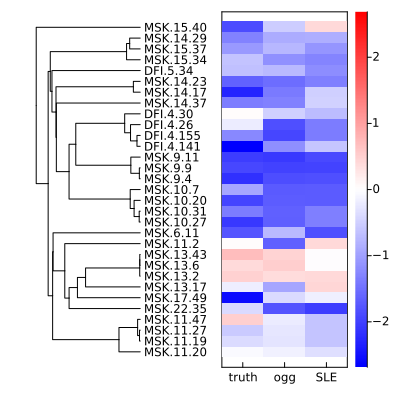

In [125]:
pltmtx = Matrix(hadruspltdf[:, [:truth, :preds_ogg, :preds_SLE]])
clims = getlims(pltmtx)
hp = heatmap(pltmtx,
    c=:bwr, clims=clims,
    xticks=(1:3, ["truth", "ogg", "SLE"]),
    yticks=false,
    framestyle=:box
)
tp = plot(hadrustree, fs=8, rightmargin=15Plots.Measures.mm)
layout = @layout [a{.4w} b]
plot(tp, hp, layout=layout, link=:y, size=(400,400))

In [126]:
savefig(joinpath(pdir, "Ahadrus_Acetate_treeandpredictions_truth-ogg-SLE.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/Ahadrus_Acetate_treeandpredictions_truth-ogg-SLE.pdf"

## Plot SLE vs OGG coefs

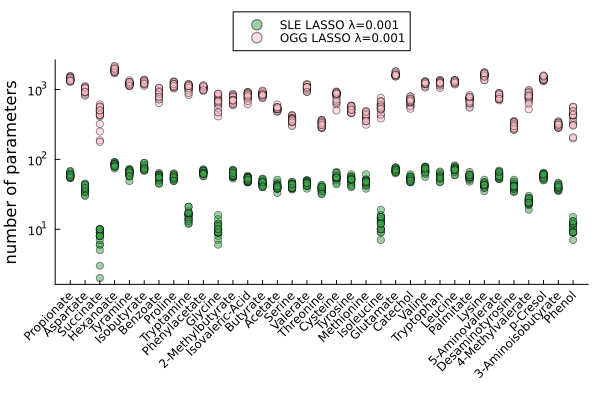

In [34]:
SLE_numcoefs = coefdf |> df->groupby(df, [:metabolite_name, :fold]) |>
    df -> combine(df, :coef => (x-> sum(x.>0)) => :num_present)
OGG_numcoefs = coefdf_ogg |> df->groupby(df, [:metabolite_name, :fold]) |>
    df -> combine(df, :coef => (x-> sum(x.>0)) => :num_present)


plot(
    yscale=:log10,
    ylabel="number of parameters",
    bottommargin=10Plots.Measures.mm,
    xrotation=45,
    legend=:outertop,
    )
@df SLE_numcoefs dotplot!(:metabolite_name, :num_present, 
    c=3, mode=:none, alpha=.5,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),  
    label="SLE LASSO λ=0.001",  
)
@df OGG_numcoefs dotplot!(:metabolite_name, :num_present, 
    c=:pink, mode=:none, alpha=.5,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),  
    label="OGG LASSO λ=0.001",  
)

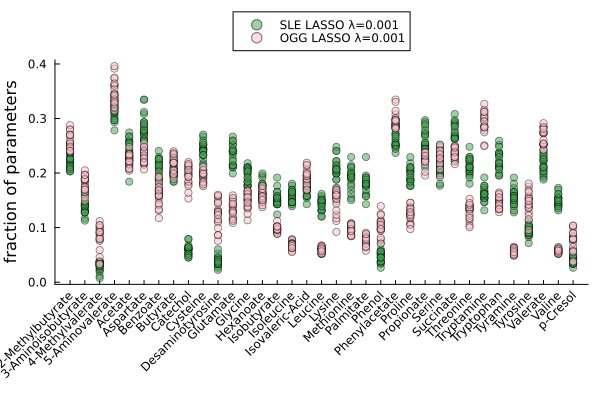

In [35]:
SLE_numcoefs = coefdf |> df->groupby(df, [:metabolite_name, :fold]) |>
    df -> combine(df, :coef => (x-> mean(x.>0)) => :num_present) |>
    df -> sort(df, :metabolite_name)
OGG_numcoefs = coefdf_ogg |> df->groupby(df, [:metabolite_name, :fold]) |>
    df -> combine(df, :coef => (x-> mean(x.>0)) => :num_present) |>
    df -> sort(df, :metabolite_name)


plot(
    # yscale=:log10,
    ylabel="fraction of parameters",
    bottommargin=10Plots.Measures.mm,
    xrotation=45,
    legend=:outertop,
    )
@df SLE_numcoefs dotplot!(:metabolite_name, :num_present, 
    c=3, mode=:none, alpha=.5,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),  
    label="SLE LASSO λ=0.001",  
)
@df OGG_numcoefs dotplot!(:metabolite_name, :num_present, 
    c=:pink, mode=:none, alpha=.5,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),  
    label="OGG LASSO λ=0.001",  
)

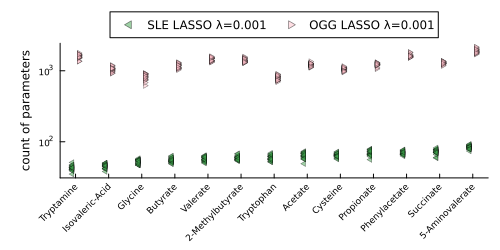

In [36]:
SLE_numcoefs = coefdf |> 
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold]) |>
    df -> combine(df, :coef => (x-> sum(x.>0)) => :num_present)

metabolite_ranking_df = groupby(SLE_numcoefs, :metabolite_name) |>
    df -> DataFrames.combine(df, :num_present => mean) |>
    df -> sort(df, :num_present_mean) |>
    df -> DataFrames.transform(df, eachindex => :rank)

SLE_numcoefs = leftjoin(SLE_numcoefs, metabolite_ranking_df, on=:metabolite_name) |> 
    df->sort(df, :rank)

OGG_numcoefs = coefdf_ogg |> 
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold]) |>
    df -> combine(df, :coef => (x-> sum(x.>0)) => :num_present)

OGG_numcoefs = leftjoin(OGG_numcoefs, metabolite_ranking_df, on=:metabolite_name) |> 
    df->sort(df, :rank)


plot(
    yscale=:log10,
    ylabel="count of parameters",
    leftmargin=5Plots.Measures.mm,
    bottommargin=7Plots.Measures.mm,
    xrotation=45,
    legend=:outertop,
    legendcolumns=2,
    size=(500,250),
    # ylims=(0,.5),
    widen=true,
    xticks=(metabolite_ranking_df.rank, metabolite_ranking_df.metabolite_name),  
    labelfontsize=8,
    tickfontsize=6,
    )
@df SLE_numcoefs dotplot!(:rank .- .1, :num_present, 
    c=3,alpha=.5, 
    side=:left, mode=:none, 
    label="SLE LASSO λ=0.001",
    markershape=:ltriangle, 
)
@df OGG_numcoefs dotplot!(:rank .+ .1, :num_present, 
    c=:pink, alpha=.5, side=:right, mode=:none,
    label="OGG LASSO λ=0.001",
    markershape=:rtriangle, 
)

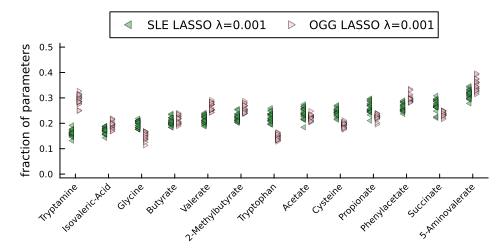

In [37]:
SLE_numcoefs = coefdf |> 
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold]) |>
    df -> combine(df, :coef => (x-> mean(x.>0)) => :num_present) |> 
    df -> sort(df, :metabolite_name)

metabolite_ranking_df = groupby(SLE_numcoefs, :metabolite_name) |>
    df -> DataFrames.combine(df, :num_present => mean) |>
    df -> sort(df, :num_present_mean) |>
    df -> DataFrames.transform(df, eachindex => :rank)

SLE_numcoefs = leftjoin(SLE_numcoefs, metabolite_ranking_df, on=:metabolite_name) |> 
    df->sort(df, :rank)

OGG_numcoefs = coefdf_ogg |> 
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold]) |>
    df -> combine(df, :coef => (x-> mean(x.>0)) => :num_present) |>
    df -> sort(df, :metabolite_name)

OGG_numcoefs = leftjoin(OGG_numcoefs, metabolite_ranking_df, on=:metabolite_name) |> 
    df->sort(df, :rank)


plot(
    # yscale=:log10,
    ylabel="fraction of parameters",
    leftmargin=5Plots.Measures.mm,
    bottommargin=7Plots.Measures.mm,
    xrotation=45,
    legend=:outertop,
    legendcolumns=2,
    size=(500,250),
    ylims=(0,.5),
    widen=true,
    xticks=(metabolite_ranking_df.rank, metabolite_ranking_df.metabolite_name),  
    labelfontsize=8,
    tickfontsize=6,
    )
@df SLE_numcoefs dotplot!(:rank .- .1, :num_present, 
    c=3,alpha=.5, 
    side=:left, mode=:none, 
    label="SLE LASSO λ=0.001",
    markershape=:ltriangle, 
)
@df OGG_numcoefs dotplot!(:rank .+ .1, :num_present, 
    c=:pink, alpha=.5, side=:right, mode=:none,
    label="OGG LASSO λ=0.001",
    markershape=:rtriangle, 
)

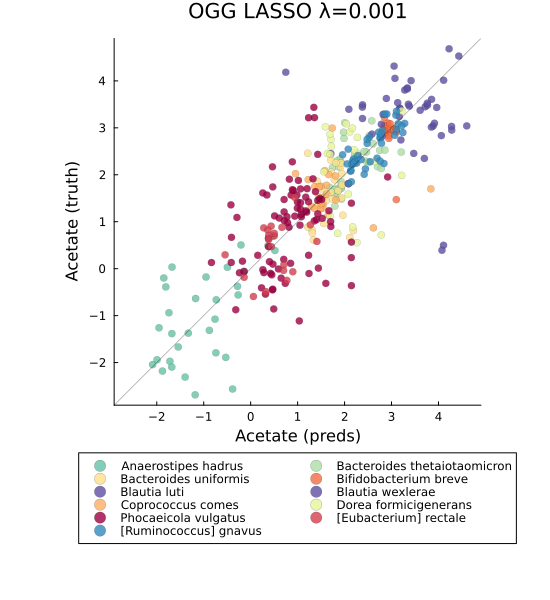

In [39]:
r = 4
metabolite_name = "Acetate"
predsdf = filter(:metabolite_name => ==(metabolite_name), oof_preds_df_stacked_ogg) |>
    df -> filter(:resample => ==(r), df)
@df predsdf scatter(
    :preds, :truth,
    group=trnYdf.species[:row_id],
    c=speciescolors_ordered,
    lims=extrema(vcat(:preds, :truth)),
    widen=true,
    ratio=1,
    size=(550,600),
    legend=:outerbottom,
    legend_column=2,
    markerstrokewidth=.1,
    alpha=.8,
    title="OGG LASSO λ=$λ",
    xlabel="$metabolite_name (preds)",
    ylabel="$metabolite_name (truth)",
)
plot!(identity, -20, 20, c=:black, alpha=.5, lw=0.5)

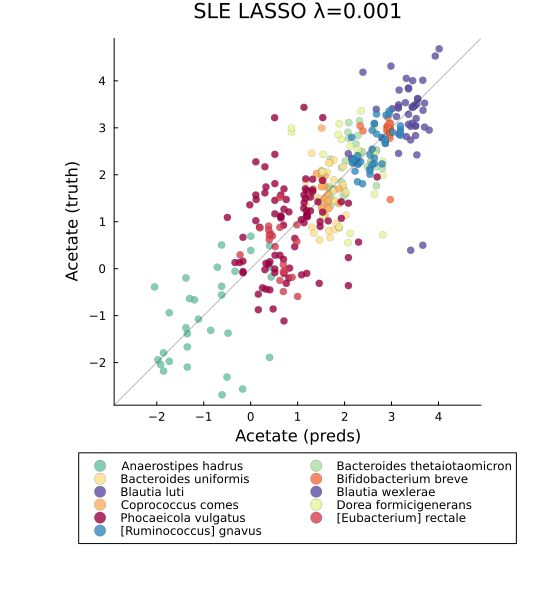

In [40]:
r = 4
metabolite_name = "Acetate"
predsdf = filter(:metabolite_name => ==(metabolite_name), oof_preds_df_stacked) |>
    df -> filter(:resample => ==(r), df)
@df predsdf scatter(
    :preds, :truth,
    group=trnYdf.species[:row_id],
    c=speciescolors_ordered,
    lims=extrema(vcat(:preds, :truth)),
    widen=true,
    ratio=1,
    size=(550,600),
    legend=:outerbottom,
    legend_column=2,
    markerstrokewidth=.1,
    alpha=.8,
    title="SLE LASSO λ=$λ",
    xlabel="$metabolite_name (preds)",
    ylabel="$metabolite_name (truth)",
)
plot!(identity, -20, 20, c=:black, alpha=.5, lw=0.5)

In [41]:
pltdf = filter(:metabolite_name => ==("Acetate"), coefdf_ogg) |>
#  df -> groupby(df, :fold) |>
 df -> unstack(df, :fold, :coef);

In [42]:
pltmtx = Matrix(pltdf[:, 3:end])
pltvec = abs.(mean(pltmtx, dims=2))|>vec

5449-element Vector{Float64}:
 0.0
 8.250634967813501e-6
 0.0
 2.2335458023993525e-6
 0.0004255646859692028
 0.0
 0.0
 0.0009941177406177192
 0.003999050924651647
 0.0
 ⋮
 0.0
 5.4087365339996725e-5
 0.017904278082992317
 7.593617184395569e-5
 0.0
 4.840705933362164e-5
 0.0
 0.032794083159648255
 0.00021640141313432698

In [43]:
quantile(pltvec, 0:.1:1)

11-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 4.609308718576352e-6
 2.7033540134014115e-5
 0.00010592599621399065
 0.0003817308757846959
 0.0020297925806595455
 0.01197993865299566
 0.607488994906368

In [44]:
mean(pltvec .> 0.001)

0.2426133235456047

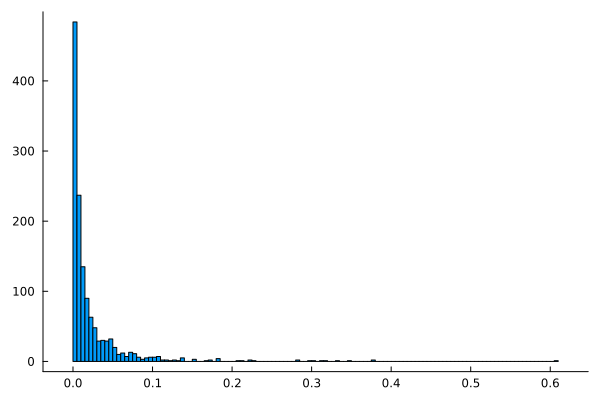

In [46]:
histogram(pltvec[pltvec .> 0.001], trim=true)

## Get OGGs per branch

In [47]:
rdir = projectdir("_research", "SLE_LASSO_featureinterpretation") |> mkpath
tdir = joinpath(rdir, "foldtrees") |> mkpath

"/Users/ben/projects/Doran_etal_2022/_research/SLE_LASSO_featureinterpretation/foldtrees"

In [48]:
function hierarchical_q_test(mtx, grp1_idx, grp2_idx; nperms=100)
    # make null
    null_qs = map(1:nperms) do i
        perm_idx = shuffle(axes(mtx, 1))
        qs = mapslices(mtx, dims=1) do column
            q = pvalue(MannWhitneyUTest(column[perm_idx][grp1_idx], column[perm_idx][grp2_idx]))
        end
        minimum(qs)
    end
    # compare reference pval to null pvals
    qvals = mapslices(mtx, dims=1) do column
        pval = pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
        mean(null_qs .< pval)
    end |> vec
end

function log2FC(a, b) 
    mean(log2.(a .+ 1)) - mean(log2.(b .+ 1))
end

log2FC (generic function with 1 method)

In [49]:
acetate_SLE_coefs_per_fold = filter(:metabolite_name => ==("Acetate"), coefdf);

In [50]:
bbogg_names = biobank["oggs"].var_names[ogg_mask];

In [42]:
# # took 172 minutes (2.8 hours) to compute
# λ = 1e-3
# REPS = 5
# NFOLDS = 4

# OGGSLE_coefdf = DataFrame()
# for (i, (fold_trn, fold_tst)) in collect(enumerate(folds))
#     # (i, (fold_trn, fold_tst)) = (1, folds[1])
#     # (i, (fold_trn, fold_tst)) = (2, folds[2])

#     fold_oggmtx = bbmtx_trn[fold_trn, :]
#     fold_rowobs = bbobs_trn[fold_trn, :];

#     # Use tree to get lineage traces for each training and test sample
#     foldPCs = UPfullPCs[fold_trn,:]
#     trn_nns = map(r->partialsortperm(r, 1:K), eachrow(subsetDij[fold_trn, fold_trn]))
#     tst_nns = map(r->partialsortperm(r, 1:K), eachrow(subsetDij[fold_tst, fold_trn]))

#     foldhc = hclust(subsetDij[fold_trn, fold_trn], linkage=:average, branchorder=:optimal)
#     foldtree = readnw(SPI.nwstr(foldhc, trnYdf.ID[fold_trn], labelinternalnodes=false))

#     writenw(joinpath(tdir, "CSB_foldtree_folditer=$(i)_fold=$(((i-1)%NFOLDS)+1)_resample=$(((i-1)÷NFOLDS)+1).nw"), foldtree)
#     # ladderize!(foldtree, rev=false)
    
#     # Make SLE spectral lineage encoding
#     trnXdf_all = map(prewalk(foldtree)) do node
#         tmp = zeros(length(fold_trn))
#         tmp[indexin(getleafnames(node), trnYdf.ID[fold_trn])] .= 1
#         "node__$(id(node))" => tmp
#     end |> DataFrame;
#     isinternal_fold = map(!isleaf, prewalk(foldtree));
#     treedists = mapinternalnodes(foldtree) do node
#         network_distance(foldtree, node)
#     end
#     trnXdf = trnXdf_all[:, isinternal_fold];
#     trnXdf = trnXdf[:, sortperm(treedists)];
#     # rename!(trnXdf, ["node__$i" for i in 1:size(trnXdf, 2)])
    
#     # get patristic distances for each node
#     pattreedists = mapinternalnodes(foldtree) do node
#         patristic_distance(foldtree, node)
#     end
    
#     # get feature importance of each node in SLE LASSO model
#     meanabs_featimportance = vec(abs.(mean(Matrix(unstack(acetate_SLE_coefs_per_fold, :fold, :class, :coef)[:, 2:end]), dims=1)))
#     # split into shallow vs deep; collect most important 3 nodes
#     shallowdepth = pattreedists[sortperm(treedists)] .< 2.2
#     top3shallowbranches = partialsortperm(meanabs_featimportance[shallowdepth], 1:3, rev=true)
#     top3deepbranches = partialsortperm(meanabs_featimportance[.!shallowdepth], 1:3, rev=true)
#     # Get node ids of most important features
#     shallow_node_ids = parse.(Int, last.(split.(names(trnXdf)[shallowdepth][top3shallowbranches], "__")))
#     deep_node_ids = parse.(Int, last.(split.(names(trnXdf)[.!shallowdepth][top3deepbranches], "__")))


#     # make iterator of top important nodes
#     ranks = repeat(collect(1:3), 2)
#     treelevels = [repeat(["shallow"], 3); repeat(["deep"], 3)]
#     treenode_ids = [shallow_node_ids; deep_node_ids]
#     importantnodes_iter = zip(ranks, treelevels, treenode_ids)


#     for (rank, treelevel, nodeid) = importantnodes_iter
#         # (rank, treelevel, nodeid) = first(importantnodes_iter)
#         node = filter(n -> id(n) == nodeid, prewalk(foldtree))[1]
    
#         # 1 vs. rest tests
#         idx = indexin(getleafnames(node), fold_rowobs.ID)
#         grp1_idx_1vrest = idx
#         grp2_idx_1vrest = Not(idx)
#         qs_1vsrest = hierarchical_q_test(fold_oggmtx, grp1_idx_1vrest, grp2_idx_1vrest)
    
#         log2FCs_1vrest = mapslices(fold_oggmtx, dims=1) do column
#             log2FC(column[grp1_idx_1vrest], column[grp2_idx_1vrest])
#         end |> vec
    
#         grp1_prp_exp_1vrest = mapslices(fold_oggmtx, dims=1) do column
#             mean(column[grp1_idx_1vrest] .> 0)
#         end |> vec
    
#         grp2_prp_exp_1vrest = mapslices(fold_oggmtx, dims=1) do column
#             mean(column[grp2_idx_1vrest] .> 0)
#         end |> vec
    
#         # 1 vs. sibling
#         node_parent = parent(node)
#         grp1_idx_1vsib = indexin(getleafnames(children(node_parent)[1]), fold_rowobs.ID)
#         grp2_idx_1vsib = indexin(getleafnames(children(node_parent)[2]), fold_rowobs.ID)
#         if grp1_idx_1vsib != idx
#             grp2_idx_1vsib = grp1_idx_1vsib
#             grp1_idx_1vsib = idx
#         end
#         qs_1vssibling = hierarchical_q_test(fold_oggmtx, grp1_idx_1vsib, grp2_idx_1vsib)
    
#         log2FCs_1vsib = mapslices(fold_oggmtx, dims=1) do column
#             log2FC(column[grp1_idx_1vsib], column[grp2_idx_1vsib])
#         end |> vec
    
#         grp1_prp_exp_1vsib = mapslices(fold_oggmtx, dims=1) do column
#             mean(column[grp1_idx_1vsib] .> 0)
#         end |> vec
    
#         grp2_prp_exp_1vsib = mapslices(fold_oggmtx, dims=1) do column
#             mean(column[grp2_idx_1vsib] .> 0)
#         end |> vec
    
#         testdf = DataFrame(
#             :fold => ((i-1)%NFOLDS)+1,
#             :resample => ((i-1)÷NFOLDS)+1,
#             :fold_iter => i,
#             :rank => rank,
#             :tree_level => treelevel,
#             :node_id => nodeid,
#             :node_importance => meanabs_featimportance[shallowdepth][top3shallowbranches][rank],
#             :oggnames => bbogg_names,
#             :log2FC_1vrest => log2FCs_1vrest,
#             :grp1_prp_exp_1vrest => grp1_prp_exp_1vrest,
#             :grp2_prp_exp_1vrest => grp2_prp_exp_1vrest,
#             :log2FC_1vsib => log2FCs_1vsib,
#             :grp1_prp_exp_1vsib => grp1_prp_exp_1vsib,
#             :grp2_prp_exp_1vsib => grp2_prp_exp_1vsib,
#             :Q_1vrest => qs_1vsrest,
#             :Q_1vsib => qs_1vssibling,
#         )
#         OGGSLE_coefdf = vcat(OGGSLE_coefdf, testdf)
#     end
# end
# CSV.write(joinpath(rdir, "OGG_significance_for_SLE_LASSO_important_nodes_per_fold"), OGGSLE_coefdf)

In [25]:
OGGSLE_coefdf = CSV.read(joinpath(rdir, "OGG_significance_for_SLE_LASSO_important_nodes_per_fold"), DataFrame);

In [26]:
# large effects at the sibling level 
#   filters:
#       if significant by Qbh test; 
#       if at least half of one group has the OGG;
#       if the |LFC| >= 1 or |g1% - g2%| >= 75%
sigsibling_OGGSLE = OGGSLE_coefdf |>
    df -> DataFrames.transform(df,
        :Q_1vrest => (x -> adjust(x, BenjaminiHochberg())) => :Q_1vrest_bh,
        :Q_1vsib => (x -> adjust(x, BenjaminiHochberg())) => :Q_1vsib_bh
    ) |>
    df -> subset(df,
        :Q_1vsib_bh => (x -> x .< 0.05),
        [:grp1_prp_exp_1vsib, :grp2_prp_exp_1vsib] => ((g1, g2) -> (g1 .>= 0.5) .|| (g2 .>= 0.5)),
        [:grp1_prp_exp_1vsib, :grp2_prp_exp_1vsib, :log2FC_1vsib] => (((g1, g2, lfc) -> @. (abs(g1 - g2) >= 0.75) || (abs(lfc) >= 1))),
    );
size(sigsibling_OGGSLE)

(29303, 18)

In [245]:
sigsibling_OGGSLE

Row,fold,resample,fold_iter,rank,tree_level,node_id,node_importance,oggnames,log2FC_1vrest,grp1_prp_exp_1vrest,grp2_prp_exp_1vrest,log2FC_1vsib,grp1_prp_exp_1vsib,grp2_prp_exp_1vsib,Q_1vrest,Q_1vsib,Q_1vrest_bh,Q_1vsib_bh
,Int64,Int64,Int64,Int64,String,Int64,Float64,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1,1,1,1,shallow,287,1.07231,2Z7IJ,-1.1924,0.653226,0.20979,-1.1924,0.653226,1.0,0.0,0.0,0.0,0.0
2,1,1,1,1,shallow,287,1.07231,2Z7IU,-0.983871,0.016129,0.20979,-0.983871,0.016129,1.0,0.0,0.0,0.0,0.0
3,1,1,1,1,shallow,287,1.07231,2Z7J3,-0.854839,0.145161,0.20979,-0.854839,0.145161,1.0,1.0,0.0,1.0,0.0
4,1,1,1,1,shallow,287,1.07231,2Z7N4,-1.15466,0.0403226,0.769231,-1.15466,0.0403226,1.0,0.0,0.0,0.0,0.0
5,1,1,1,1,shallow,287,1.07231,2Z7T3,-0.862903,0.137097,1.0,-0.862903,0.137097,1.0,0.0,0.0,0.0,0.0
6,1,1,1,1,shallow,287,1.07231,2Z813,-0.983871,0.016129,0.20979,-0.983871,0.016129,1.0,0.0,0.0,0.0,0.0
7,1,1,1,1,shallow,287,1.07231,2Z8BZ,-1.14344,0.701613,0.20979,-1.14344,0.701613,1.0,0.0,0.0,0.0,0.0
8,1,1,1,1,shallow,287,1.07231,2Z8HY,-1.00974,0.604839,0.195804,-1.00974,0.604839,0.933333,0.0,0.0,0.0,0.0
9,1,1,1,1,shallow,287,1.07231,2Z8RF,-1.0,0.0,0.20979,-1.0,0.0,1.0,0.0,0.0,0.0,0.0


In [27]:
groupby(sigsibling_OGGSLE, [:tree_level, :rank, :fold_iter]) |>
    # gdf -> unstack(gdf, :fold_iter, :oggnames, ones)
    df -> combine(df, nrow) |>
    df -> sort(df, [:tree_level, :rank, :fold_iter]) |> 
    df -> groupby(df, [:tree_level, :rank]) |>
    df -> combine(df, 
        :nrow => mean,
        :nrow => std,
        :nrow => median,
        :nrow => minimum,
        :nrow => maximum,
    )

Row,tree_level,rank,nrow_mean,nrow_std,nrow_median,nrow_minimum,nrow_maximum
,String7,Int64,Float64,Float64,Float64,Int64,Int64
1,shallow,1,313.3,151.986,195.5,179,536
2,shallow,2,255.7,140.61,192.5,139,555
3,shallow,3,330.85,156.374,408.0,17,527
4,deep,1,265.3,58.5303,253.5,220,503
5,deep,2,171.65,189.743,105.0,7,592
6,deep,3,135.105,247.31,37.0,1,1001


In [28]:
ranks = repeat(collect(1:3), 2)
treelevels = [repeat(["shallow"], 3); repeat(["deep"], 3)]

6-element Vector{String}:
 "shallow"
 "shallow"
 "shallow"
 "deep"
 "deep"
 "deep"

In [29]:
upvarmeta = CSV.read(datadir("exp_raw","UP7047","UPcolmeta.csv"), DataFrame);

In [44]:
repeatable_OGGSLE = DataFrame()
for (t, r) in zip(treelevels, ranks)
    tmpdf = sigsibling_OGGSLE |>
        df -> subset(df,
            :tree_level => x -> x .== t,
            :rank => x -> x .== r,
        ) |>
        df -> groupby(df, :oggnames) |>
        df -> combine(df, nrow => :repeat_count) |>
        # df -> subset(df, :repeat_count => x-> x .>= quantile(x, 0.9))
        df -> subset(df, :repeat_count => x-> x .>= 18)
        # df -> df.oggnames

    tmpdf[!, :tree_level] .= t
    tmpdf[!, :rank] .= r

    repeatable_OGGSLE = vcat(repeatable_OGGSLE, tmpdf)
end

UPoggfunctions = unique(upvarmeta[filter(!isnothing, indexin(repeatable_OGGSLE.oggnames, upvarmeta.og)), [:og, :description, :COG_categories]])
repeatable_OGGSLE = leftjoin(repeatable_OGGSLE, UPoggfunctions, on=:oggnames => :og)

ogg_lasso_importance = filter(:metabolite_name => ==("Acetate"), coefdf_ogg) |>
    df -> unstack(df, :fold, :coef) |>
    df -> Matrix(df[:, 3:end]) |>
    mtx -> abs.(mean(mtx, dims=2)) |>
    vec
repeatable_OGGSLE[!, :ogg_lasso_feature_importance] .= ogg_lasso_importance[indexin(repeatable_OGGSLE.oggnames, bbogg_names)]

CSV.write(joinpath(rdir, "Repeatable_important-OGGs_SLE-LASSO.csv"), repeatable_OGGSLE)

"/Users/ben/projects/Doran_etal_2022/_research/SLE_LASSO_featureinterpretation/Repeatable_important-OGGs_SLE-LASSO.csv"

In [45]:
repeatable_OGGSLE

Row,oggnames,repeat_count,tree_level,rank,description,COG_categories,ogg_lasso_feature_importance
,String15,Int64,String,Int64,String?,String7?,Float64
1,COG0120,19,shallow,1,Catalyzes the reversible conversion of ribose-5- phosphate to ribulose 5-phosphate,G,3.93138e-5
2,COG0368,19,shallow,1,Joins adenosylcobinamide-GDP and alpha-ribazole to generate adenosylcobalamin (Ado-cobalamin). Also synthesizes adenosylcobalamin 5'-phosphate from adenosylcobinamide-GDP and alpha-ribazole 5'-phosphate,H,4.04946e-5
3,COG0715,19,shallow,1,thiamine-containing compound biosynthetic process,P,0.0764975
4,COG0786,19,shallow,1,glutamate:sodium symporter activity,P,0.0371088
5,COG1010,19,shallow,1,Tetrapyrrole (Corrin/Porphyrin) Methylases,H,7.45237e-6
6,COG1058,18,shallow,1,Probable molybdopterin binding domain,S,0.00168863
7,COG1270,19,shallow,1,Converts cobyric acid to cobinamide by the addition of aminopropanol on the F carboxylic group,H,0.00011737
8,COG1492,19,shallow,1,cobalamin biosynthetic process,H,7.20061e-5
9,COG1649,19,shallow,1,"PFAM Uncharacterised BCR, COG1649",F,0.000302251


In [46]:
shallow_oggs = [
    "COG0120","COG0368","COG0715","COG0786","COG1010",
    "COG1058","COG1270","COG1492","COG1649","COG1797",
    "COG1903","COG2038","COG2073","COG2082","COG2087",
    "COG2099","COG2241","COG2242","COG2243","COG2326",
    "COG2875","COG3027","COG4822","COG5496",
]

deep_oggs = [
    "2ZAQ1","COG0120","COG0277","COG0786","COG1063",
    "COG1620","COG1649","COG1887","COG2373","COG5496",
    "COG0155","COG0549","COG0560","COG0675","COG1445",
    "COG1823","COG1896","COG2140","COG3414","COG3635",
    "COG3711","COG3835","COG3858",
]
intersect(shallow_oggs, deep_oggs)

4-element Vector{String}:
 "COG0120"
 "COG0786"
 "COG1649"
 "COG5496"

OGGs: that are shared shallow and deep under sibling tests

* COG0120: Catalyzes the reversible conversion of ribose-5- phosphate to ribulose 5-phosphate, 3.93e-5
* COG0786: glutamate:sodium symporter activity, 0.037
* COG1649: "PFAM Uncharacterised BCR, COG1649", 0.0003
* COG5496: not annotated (possible hydrolase), 0.037

In [47]:
length(shallow_oggs)

24

In [48]:
length(deep_oggs)

23

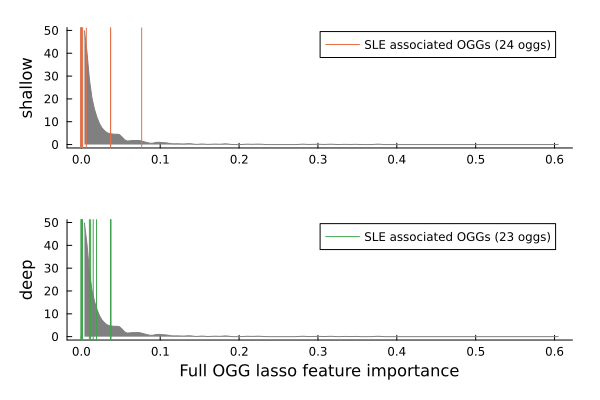

In [50]:
p1 = plot(ylabel="shallow", size=(600, 200), margin=5Plots.Measures.mm)
density!(filter(>(0.001), ogg_lasso_importance), c=:grey, trim=true, fill=0)
@df filter(:tree_level => ==("shallow"), repeatable_OGGSLE) vline!(:ogg_lasso_feature_importance,c =2, label="SLE associated OGGs ($(length(:rank)) oggs)")

p2 = plot(ylabel="deep", xlabel="Full OGG lasso feature importance", size=(600, 200), margin=5Plots.Measures.mm)
density!(filter(>(0.001), ogg_lasso_importance), c=:grey, trim=true, fill=0)
@df filter(:tree_level => ==("deep"), repeatable_OGGSLE) vline!(:ogg_lasso_feature_importance, c=3, label="SLE associated OGGs ($(length(:rank)) oggs)")

plot(p1, p2, layout=grid(2,1), size=(600, 400))

In [359]:
# # large effects at the 1 vs rest level 
# #   filters:
# #       if significant by Qbh test; 
# #       if at least half of one group has the OGG;
# #       if the |LFC| >= 1 or |g1% - g2%| >= 75%
# sigrest_OGGSLE = OGGSLE_coefdf |>
#     df -> DataFrames.transform(df,
#         :Q_1vrest => (x -> adjust(x, BenjaminiHochberg())) => :Q_1vrest_bh,
#         :Q_1vsib => (x -> adjust(x, BenjaminiHochberg())) => :Q_1vsib_bh
#     ) |>
#     df -> subset(df,
#         :Q_1vsib_bh => (x -> x .< 0.05),
#         [:grp1_prp_exp_1vrest, :grp2_prp_exp_1vrest] => ((g1, g2) -> (g1 .>= 0.5) .|| (g2 .>= 0.5)),
#         [:grp1_prp_exp_1vrest, :grp2_prp_exp_1vrest, :log2FC_1vrest] => (((g1, g2, lfc) -> @. (abs(g1 - g2) >= 0.75) || (abs(lfc) >= 1))),
#     );
# size(sigrest_OGGSLE)
# sigrest_OGGSLE
# groupby(sigrest_OGGSLE, [:tree_level, :rank, :fold_iter]) |>
#     # gdf -> unstack(gdf, :fold_iter, :oggnames, ones)
#     df -> combine(df, nrow) |>
#     df -> sort(df, [:tree_level, :rank, :fold_iter]) |> 
#     df -> groupby(df, [:tree_level, :rank]) |>
#     df -> combine(df, 
#         :nrow => mean,
#         :nrow => std,
#         :nrow => median,
#         :nrow => minimum,
#         :nrow => maximum,
#     )
# ranks = repeat(collect(1:3), 2)
# treelevels = [repeat(["shallow"], 3); repeat(["deep"], 3)]
# upvarmeta = CSV.read(datadir("exp_raw","UP7047","UPcolmeta.csv"), DataFrame);
# repeatable_OGGSLE_rest = DataFrame()
# for (t, r) in zip(treelevels, ranks)
#     tmpdf = sigrest_OGGSLE |>
#         df -> subset(df,
#             :tree_level => x -> x .== t,
#             :rank => x -> x .== r,
#         ) |>
#         df -> groupby(df, :oggnames) |>
#         df -> combine(df, nrow => :repeat_count) |>
#         # df -> subset(df, :repeat_count => x-> x .>= quantile(x, 0.9))
#         df -> subset(df, :repeat_count => x-> x .>= 18)
#         # df -> df.oggnames

#     tmpdf[!, :tree_level] .= t
#     tmpdf[!, :rank] .= r

#     repeatable_OGGSLE_rest = vcat(repeatable_OGGSLE_rest, tmpdf)
# end

# UPoggfunctions = unique(upvarmeta[filter(!isnothing, indexin(repeatable_OGGSLE_rest.oggnames, upvarmeta.og)), [:og, :description, :COG_categories]])
# repeatable_OGGSLE_rest = leftjoin(repeatable_OGGSLE_rest, UPoggfunctions, on=:oggnames => :og)

# ogg_lasso_importance = filter(:metabolite_name => ==("Acetate"), coefdf_ogg) |>
#     df -> unstack(df, :fold, :coef) |>
#     df -> Matrix(df[:, 3:end]) |>
#     mtx -> abs.(mean(mtx, dims=2)) |>
#     vec
# repeatable_OGGSLE_rest[!, :ogg_lasso_feature_importance] .= ogg_lasso_importance[indexin(repeatable_OGGSLE_rest.oggnames, ogg_names)]

# CSV.write(joinpath(rdir, "Repeatable_important-OGGs_SLE-LASSO_1vrest.csv"), repeatable_OGGSLE_rest)
# p1 = plot(ylabel="shallow", size=(600, 200), margin=5Plots.Measures.mm)
# density!(filter(>(0.001), ogg_lasso_importance), c=:grey, trim=true, fill=0)
# @df filter(:tree_level => ==("shallow"), repeatable_OGGSLE_rest) vline!(:ogg_lasso_feature_importance,c =2, label="SLE associated OGGs ($(length(:rank)) oggs)")
# p2 = plot(ylabel="deep", xlabel="OGG lasso feature importance", size=(600, 200), margin=5Plots.Measures.mm)
# density!(filter(>(0.001), ogg_lasso_importance), c=:grey, trim=true, fill=0)
# @df filter(:tree_level => ==("deep"), repeatable_OGGSLE_rest) vline!(:ogg_lasso_feature_importance, c=3, label="SLE associated OGGs ($(length(:rank)) oggs)")
# plot(p1, p2, layout=grid(2,1), size=(600, 400))

## Make train LASSO model with filtered OGGs

In [51]:
bbbmtx = float.(bbmtx_trn.>0);

In [134]:
ogglasso_mostimportant_mask = ogg_lasso_importance .> quantile(ogg_lasso_importance, .995);

In [135]:
quantile(ogg_lasso_importance, .995)

0.1387845609518198

In [136]:
sum(ogglasso_mostimportant_mask)

28

In [137]:
ogglasso_oggnames = biobank["oggs"].var_names[ogg_mask][ogglasso_mostimportant_mask]
upvarmeta[filter(!isnothing, indexin(ogglasso_oggnames, upvarmeta.og)), [:og, :description, :COG_categories]]

Row,og,description,COG_categories
,String7,String?,String7
1,2Z86D,Glycosyl transferase,S
2,2Z9M2,"Psort location CytoplasmicMembrane, score",S
3,32UZ0,"Psort location CytoplasmicMembrane, score",S
4,COG0267,Belongs to the bacterial ribosomal protein bL33 family,J
5,COG0656,aldo-keto reductase (NADP) activity,S
6,COG1733,regulation of RNA biosynthetic process,K
7,COG2327,slime layer polysaccharide biosynthetic process,S
8,COG3227,Zinc metalloprotease (Elastase),E
9,COG3316,missing,L


In [138]:
K = 1 # Make predictions with OGG-LASSO
λ = 1e-3
REPS = 5
NFOLDS = 4

seed!(424242)
cv = StratifiedCV(nfolds=NFOLDS, shuffle=true);
folds = vcat([train_test_pairs(cv, 1:sum(full_train_mask), trnYdf.species) for i in 1:REPS]...)

Xmtx = deepcopy(float.(bbmtx_trn.>0)[:, ogglasso_mostimportant_mask])
# Xmtx = mapslices(Xmtx; dims=1) do col
#     shuffle(col)
# end
Xdf = DataFrame(Xmtx, biobank["oggs"].var_names[ogg_mask][ogglasso_mostimportant_mask])



mdl = MLJLinearModels.LassoRegressor(lambda=λ)

oof_preds_df_stacked_filtered_ogg = DataFrame()
inf_preds_df_stacked_filtered_ogg = DataFrame()
coefdf_filtered_ogg = DataFrame()
for (i, (fold_trn, fold_tst)) in collect(enumerate(folds))
# (i, (fold_trn, fold_tst)) = (1, folds[1])
# (i, (fold_trn, fold_tst)) = (2, folds[2])
    trnXdf = Xdf[fold_trn, :]
    tstXdf = Xdf[fold_tst, :]

    # (target_idx, target) = findfirst(==("Phenylacetate"), orderedmetabolites_names),"Phenylacetate"
    for (target_idx, target) in enumerate(orderedmetabolites_names)
        mach = machine(mdl, trnXdf, metab_trnY[fold_trn, target_idx])
        Base.with_logger(Base.NullLogger()) do
            fit!(mach, verbosity=0)
        end
        
        # save results of trained model
        inf_preds_df_stacked_filtered_ogg = vcat(inf_preds_df_stacked_filtered_ogg, DataFrame(
            :row_id => fold_trn,
            :metabolite_name => target,
            :fold => ((i-1)%NFOLDS)+1,
            :resample => ((i-1)÷NFOLDS)+1,
            :truth => metab_trnY[fold_trn, target_idx],
            :preds => MLJ.predict(mach, trnXdf),
        ))

        oof_preds_df_stacked_filtered_ogg = vcat(oof_preds_df_stacked_filtered_ogg, DataFrame(
            :row_id => fold_tst,
            :metabolite_name => target,
            :fold => ((i-1)%NFOLDS)+1 ,
            :resample => ((i-1)÷NFOLDS)+1 ,
            :truth => metab_trnY[fold_tst, target_idx],
            :preds => MLJ.predict(mach, tstXdf),
        ))

        coefdf_filtered_ogg = vcat(coefdf_filtered_ogg, stack(DataFrame(fitted_params(mach).coefs)) |>
            df-> DataFrames.select(df,
                :value => ByRow(x->target) => :metabolite_name,
                :value => ByRow(x->i) => :fold,
                :variable => :ogg,
                :value => :coef,
            )
        )
    end;
    println("on $(i)th resample")
end

CSV.write(joinpath(rdir, "oof_predictions_stacked_filteredOGGlasso_lambda=$(λ).csv"), oof_preds_df_stacked_filtered_ogg)
CSV.write(joinpath(rdir, "infold_predictions_stacked_filteredOGGlasso_lambda=$(λ).csv"), inf_preds_df_stacked_filtered_ogg)

CSV.write(joinpath(rdir, "coefs_filteredOGGlasso_lambda=$(λ).csv"), coefdf_filtered_ogg)

on 1th resample


on 2th resample


on 3th resample


on 4th resample


on 5th resample


on 6th resample


on 7th resample


on 8th resample


on 9th resample


on 10th resample


on 11th resample


on 12th resample


on 13th resample


on 14th resample


on 15th resample


on 16th resample


on 17th resample


on 18th resample


on 19th resample


on 20th resample


"/Users/ben/projects/Doran_etal_2022/_research/SLE_LASSO_featureinterpretation/coefs_filteredOGGlasso_lambda=0.001.csv"

In [145]:
sbalassopltdf = oof_preds_df_stacked |> #filter(:resample => ==(1), oof_preds_df_stacked) |>
    df -> rename(df, :preds => :preds_SBA) |>
    df -> select(df, [:row_id, :metabolite_name, :fold, :resample, :truth, :preds_SBA]) |>
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df,
        [:preds_SBA, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_SBA, 
    ) |>
    df -> groupby(df, [:metabolite_name]) |>
    df -> DataFrames.transform(df, 
        :rsquared_SBA => mean,
        [:fold, :resample] => ((x, y) -> x.*y) => :fold_iter,
    ) |>
    df -> stack(df, :rsquared_SBA) 

filteredogglassopltdf = oof_preds_df_stacked_filtered_ogg |> #filter(:resample => ==(1), oof_preds_df_stacked) |>
    df -> rename(df, :preds => :preds_ogg) |>
    df -> select(df, [:row_id, :metabolite_name, :fold, :resample, :truth, :preds_ogg]) |>
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df,
        [:preds_ogg, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_ogg_filt, 
    ) |>
    df -> groupby(df, [:metabolite_name]) |>
    df -> DataFrames.transform(df, 
        :rsquared_ogg_filt => mean,
        [:fold, :resample] => ((x, y) -> x.*y) => :fold_iter,
    ) |>
    df -> stack(df, :rsquared_ogg_filt) 
filteredogglassopltdf[!,:rsquared_SBA_mean] .= sbalassopltdf.rsquared_SBA_mean[indexin(filteredogglassopltdf.metabolite_name, sbalassopltdf.metabolite_name)]

pltdf = vcat(select(sbalassopltdf, [:metabolite_name, :rsquared_SBA_mean, :variable, :value]),
             select(filteredogglassopltdf, [:metabolite_name, :rsquared_SBA_mean, :variable, :value])) |>
    df -> sort(df, :rsquared_SBA_mean)

sigresults = pltdf |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df,
        :rsquared_SBA_mean => first => :rsquared_SBA_mean,
        [:variable, :value] => ((grp, rsqval) -> 
            #     MannWhitneyUTest() UnequalVarianceTTest()
            pvalue(UnequalVarianceTTest(rsqval[grp.=="rsquared_SBA"], rsqval[grp.=="rsquared_ogg_filt"]), tail=:both)) => :pval
    ) |> 
    df -> DataFrames.transform(df, :pval => (p->adjust(p, BenjaminiHochberg())) => :pval_bh) |>
    df -> DataFrames.transform(df, :pval_bh => (p->floor.(Int, log10.(1 ./ p))) => :poweroftest);


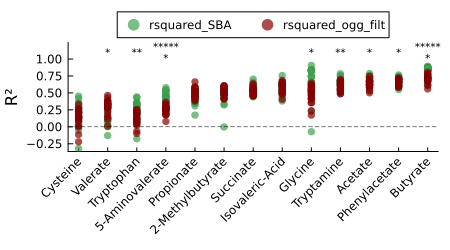

In [146]:
plot(
    ylabel="R²",
    bottommargin=10Plots.Measures.mm,
    xrotation=45,
    legend=:outertop,
    legendcolumns=2,)
@df pltdf dotplot!(
    string.(round.(:rsquared_SBA_mean, digits=6)), :value,
    group=:variable,
    mode=:none,
    alpha=.7,
    markerstrokewidth=0,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),
    ylims=(-Inf, 1.2),
    widen=true,
    size=(450, 250),
    # label="Full lasso",
    c=[3 :darkred],
)
hline!([0], c=:black, lw=.5, linestyle=:dash)
@df sigresults annotate!(
    string.(round.(:rsquared_SBA_mean, digits=6)), 
    ones(nrow(sigresults)) .+ 0.1,
    text.(
        replace.(repeat.("*", :poweroftest), r"(.{5})"=>s"\1\n"),
        # "1e-" .* string.(:poweroftest),
        7, :center,
    )
)

In [576]:
savefig(joinpath(pdir, "improvedmetabolites_sba-vs-filtogg_dotplot.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/improvedmetabolites_sba-vs-filtogg_dotplot.pdf"

In [147]:
oof_preds_SLE_lassos = leftjoin(filter(:resample => ==(4), oof_preds_df_stacked), fulllasso_oofpreds_stacked,
        on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> leftjoin(df, top3_oofpreds_stacked, on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> leftjoin(df, filter(:resample => ==(4), oof_preds_df_stacked_ogg), on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> leftjoin(df, filter(:resample => ==(4), oof_preds_df_stacked_filtered_ogg), on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> select(df,
        :row_id,
        :metabolite_name,
        :truth,
        :preds => :preds_SLE,
        :preds_1 => :preds_ogg,
        :preds_2 => :preds_filtered_ogg,
        :pred_full => :preds_full,
        :pred_top3 => :preds_top3,
    );

In [148]:
treeorder = indexin(getleafnames(subsettree), bbobs_trn.ID);

In [149]:
hadrusnames = bbobs_trn.ID[findall(contains.(bbobs_trn.species, "hadrus"))]
hadrus_treeidxs = indexin(hadrusnames, getleafnames(subsettree));
hadrustree = readnw(NewickTree.nwstr(NewickTree.extract(subsettree, hadrusnames)))
hadrusnames = getleafnames(hadrustree)
hadrus_treeidxs = indexin(hadrusnames, getleafnames(subsettree));

In [150]:
pltdf = filter(:metabolite_name => ==("Acetate"), oof_preds_SLE_lassos) |>
    df -> sort(df, :row_id);

In [151]:
hadruspltdf = pltdf[treeorder, :][hadrus_treeidxs,:]

Row,row_id,metabolite_name,truth,preds_SLE,preds_ogg,preds_filtered_ogg,preds_full,preds_top3
,Int64,String31,Float64,Float64,Float64?,Float64?,Float64?,Float64?
1,69,Acetate,-0.0560327,-0.333483,-0.143094,0.502548,-0.599118,2.30256
2,68,Acetate,-0.376019,-0.618599,-0.28081,1.05904,-0.300093,2.23098
3,70,Acetate,-0.560045,-0.618599,-0.266762,1.05904,-0.149325,2.23851
4,348,Acetate,0.504576,-0.618599,-0.207249,1.05904,-0.693125,2.26756
5,344,Acetate,-0.388559,-2.04722,-1.80774,0.0741948,-0.460805,2.21566
6,207,Acetate,-2.56377,-0.171042,-0.385487,-0.124596,-0.732079,2.29773
7,67,Acetate,-0.177489,0.437046,-0.951072,0.695331,-0.615918,2.23163
8,157,Acetate,0.489918,0.401936,0.368787,0.495725,0.325342,2.24444
9,312,Acetate,0.387263,0.00305167,0.516365,0.0615367,0.238725,2.31843


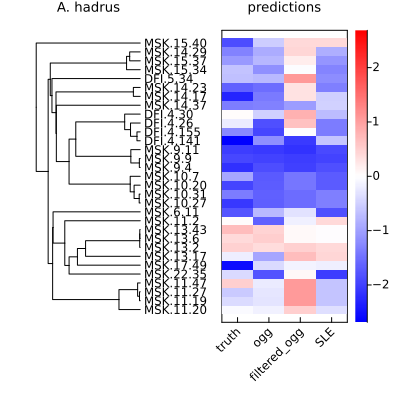

In [152]:
pltmtx = Matrix(hadruspltdf[:, [:truth, :preds_ogg, :preds_filtered_ogg, :preds_SLE]])
clims = getlims(pltmtx)
hp = heatmap(pltmtx,
    title="predictions",
    c=:bwr, clims=clims,
    xticks=(1:4, ["truth", "ogg", "filtered_ogg", "SLE"]),
    yticks=false,
    framestyle=:box,
    xrotation=45,
)
tp = plot(hadrustree, fs=8, rightmargin=15Plots.Measures.mm, title="A. hadrus")
layout = @layout [a{.4w} b]
plot(tp, hp, layout=layout, link=:y, size=(400,400), titlefontsize=9)

In [583]:
savefig(joinpath(pdir, "Ahadrus_Acetate_treeandpredictions_truth-ogg-fogg-SLE.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/Ahadrus_Acetate_treeandpredictions_truth-ogg-fogg-SLE.pdf"

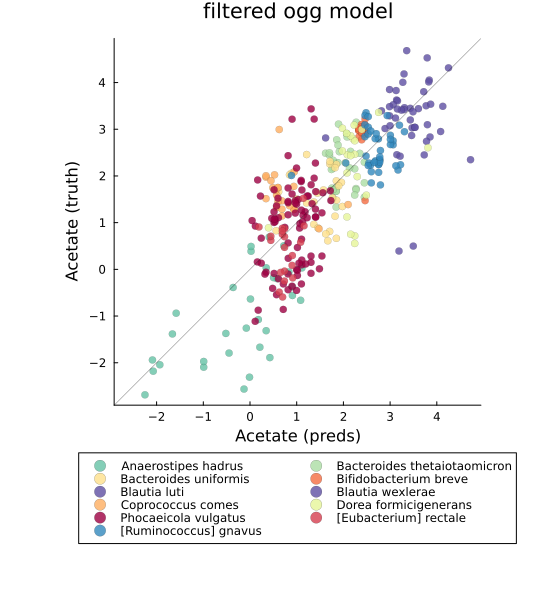

In [153]:
r = 5
metabolite_name = "Acetate"
predsdf = filter(:metabolite_name => ==(metabolite_name), oof_preds_df_stacked_filtered_ogg) |>
    df -> filter(:resample => ==(r), df)
@df predsdf scatter(
    :preds, :truth,
    group=trnYdf.species[:row_id],
    title="filtered ogg model",
    c=speciescolors_ordered,
    lims=extrema(vcat(:preds, :truth)),
    widen=true,
    ratio=1,
    size=(550,600),
    legend=:outerbottom,
    legend_column=2,
    markerstrokewidth=.1,
    alpha=.8,
    xlabel="$metabolite_name (preds)",
    ylabel="$metabolite_name (truth)",
)
plot!(identity, -20, 20, c=:black, alpha=.5, lw=0.5)

## Train LASSO model with filtered SLE OGGs

In [586]:
SLElasso_mostimportant_mask = unique(indexin(repeatable_OGGSLE.oggnames, ogg_names));

In [631]:
SLE_Xdf = DataFrame(float.(bbmtx_trn.>0)[:, SLElasso_mostimportant_mask], biobank["oggs"].var_names[ogg_mask][SLElasso_mostimportant_mask])
unique(SLE_Xdf)

Row,COG0120,COG0368,COG0715,COG0786,COG1010,COG1058,COG1270,COG1492,COG1649,COG1797,COG1903,COG2038,COG2073,COG2082,COG2087,COG2099,COG2241,COG2242,COG2243,COG2326,COG2875,COG3027,COG4822,COG5496,2ZAQ1,COG0277,COG1063,COG1620,COG1887,COG2373,COG0155,COG0549,COG0560,COG0675,COG1445,COG1823,COG1896,COG2140,COG3414,COG3635,COG3711,COG3835,COG3858
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0
5,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0
6,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0
7,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0
8,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0
9,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0


In [587]:
K = 1 # Make predictions with OGG-LASSO
λ = 1e-3
REPS = 5
NFOLDS = 4

seed!(424242)
cv = StratifiedCV(nfolds=NFOLDS, shuffle=true);
folds = vcat([train_test_pairs(cv, 1:sum(full_train_mask), trnYdf.species) for i in 1:REPS]...)


Xmtx = deepcopy(float.(bbmtx_trn.>0)[:, SLElasso_mostimportant_mask])
# Xmtx = mapslices(Xmtx; dims=1) do col
#     shuffle(col)
# end
Xdf = DataFrame(Xmtx, biobank["oggs"].var_names[ogg_mask][SLElasso_mostimportant_mask])

SLE_Xdf = DataFrame(float.(bbmtx_trn.>0)[:, SLElasso_mostimportant_mask], biobank["oggs"].var_names[ogg_mask][SLElasso_mostimportant_mask])


mdl = MLJLinearModels.LassoRegressor(lambda=λ)

oof_preds_df_stacked_filtered_SLE = DataFrame()
inf_preds_df_stacked_filtered_SLE = DataFrame()
coefdf_filtered_SLE = DataFrame()
for (i, (fold_trn, fold_tst)) in collect(enumerate(folds))
# (i, (fold_trn, fold_tst)) = (1, folds[1])
# (i, (fold_trn, fold_tst)) = (2, folds[2])
    trnXdf = Xdf[fold_trn, :]
    tstXdf = Xdf[fold_tst, :]

    # (target_idx, target) = findfirst(==("Phenylacetate"), orderedmetabolites_names),"Phenylacetate"
    for (target_idx, target) in enumerate(orderedmetabolites_names)
        mach = machine(mdl, trnXdf, metab_trnY[fold_trn, target_idx])
        Base.with_logger(Base.NullLogger()) do
            fit!(mach, verbosity=0)
        end
        
        # save results of trained model
        inf_preds_df_stacked_filtered_SLE = vcat(inf_preds_df_stacked_filtered_SLE, DataFrame(
            :row_id => fold_trn,
            :metabolite_name => target,
            :fold => ((i-1)%NFOLDS)+1,
            :resample => ((i-1)÷NFOLDS)+1,
            :truth => metab_trnY[fold_trn, target_idx],
            :preds => MLJ.predict(mach, trnXdf),
        ))

        oof_preds_df_stacked_filtered_SLE = vcat(oof_preds_df_stacked_filtered_SLE, DataFrame(
            :row_id => fold_tst,
            :metabolite_name => target,
            :fold => ((i-1)%NFOLDS)+1 ,
            :resample => ((i-1)÷NFOLDS)+1 ,
            :truth => metab_trnY[fold_tst, target_idx],
            :preds => MLJ.predict(mach, tstXdf),
        ))

        coefdf_filtered_SLE = vcat(coefdf_filtered_SLE, stack(DataFrame(fitted_params(mach).coefs)) |>
            df-> DataFrames.select(df,
                :value => ByRow(x->target) => :metabolite_name,
                :value => ByRow(x->i) => :fold,
                :variable => :ogg,
                :value => :coef,
            )
        )
    end;
    println("on $(i)th resample")
end

CSV.write(joinpath(rdir, "oof_predictions_stacked_filteredSLElasso_lambda=$(λ).csv"), oof_preds_df_stacked_filtered_SLE)
CSV.write(joinpath(rdir, "infold_predictions_stacked_filteredSLElasso_lambda=$(λ).csv"), inf_preds_df_stacked_filtered_SLE)

CSV.write(joinpath(rdir, "coefs_filteredSLElasso_lambda=$(λ).csv"), coefdf_filtered_SLE)

on 1th resample


on 2th resample


on 3th resample


on 4th resample


on 5th resample


on 6th resample


on 7th resample


on 8th resample


on 9th resample


on 10th resample


on 11th resample


on 12th resample


on 13th resample


on 14th resample


on 15th resample


on 16th resample


on 17th resample


on 18th resample


on 19th resample


on 20th resample


"/Users/ben/projects/Doran_etal_2022/_research/SLE_LASSO_featureinterpretation/coefs_filteredSLElasso_lambda=0.001.csv"

In [588]:
sbalassopltdf = oof_preds_df_stacked |> #filter(:resample => ==(1), oof_preds_df_stacked) |>
    df -> rename(df, :preds => :preds_SBA) |>
    df -> select(df, [:row_id, :metabolite_name, :fold, :resample, :truth, :preds_SBA]) |>
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df,
        [:preds_SBA, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_SBA, 
    ) |>
    df -> groupby(df, [:metabolite_name]) |>
    df -> DataFrames.transform(df, 
        :rsquared_SBA => mean,
        [:fold, :resample] => ((x, y) -> x.*y) => :fold_iter,
    ) |>
    df -> stack(df, :rsquared_SBA) 

filteredSLElassopltdf = oof_preds_df_stacked_filtered_SLE |> #filter(:resample => ==(1), oof_preds_df_stacked) |>
    df -> rename(df, :preds => :preds_ogg) |>
    df -> select(df, [:row_id, :metabolite_name, :fold, :resample, :truth, :preds_ogg]) |>
    df -> filter(:metabolite_name => ∈(improvedmetabolite_names), df) |>
    df -> groupby(df, [:metabolite_name, :fold, :resample]) |>
    df -> combine(df,
        [:preds_ogg, :truth] => ((yhat, y)->rsquared(yhat,y)) => :rsquared_SLE_filtered, 
    ) |>
    df -> groupby(df, [:metabolite_name]) |>
    df -> DataFrames.transform(df, 
        :rsquared_SLE_filtered => mean,
        [:fold, :resample] => ((x, y) -> x.*y) => :fold_iter,
    ) |>
    df -> stack(df, :rsquared_SLE_filtered) 
filteredSLElassopltdf[!,:rsquared_SBA_mean] .= sbalassopltdf.rsquared_SBA_mean[indexin(filteredSLElassopltdf.metabolite_name, sbalassopltdf.metabolite_name)]

pltdf = vcat(select(sbalassopltdf, [:metabolite_name, :rsquared_SBA_mean, :variable, :value]),
             select(filteredSLElassopltdf, [:metabolite_name, :rsquared_SBA_mean, :variable, :value])) |>
    df -> sort(df, :rsquared_SBA_mean)

sigresults = pltdf |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df,
        :rsquared_SBA_mean => first => :rsquared_SBA_mean,
        [:variable, :value] => ((grp, rsqval) -> 
            #     MannWhitneyUTest() UnequalVarianceTTest()
            pvalue(UnequalVarianceTTest(rsqval[grp.=="rsquared_SBA"], rsqval[grp.=="rsquared_SLE_filtered"]), tail=:both)) => :pval
    ) |> 
    df -> DataFrames.transform(df, :pval => (p->adjust(p, BenjaminiHochberg())) => :pval_bh) |>
    df -> DataFrames.transform(df, :pval_bh => (p->floor.(Int, log10.(1 ./ p))) => :poweroftest);


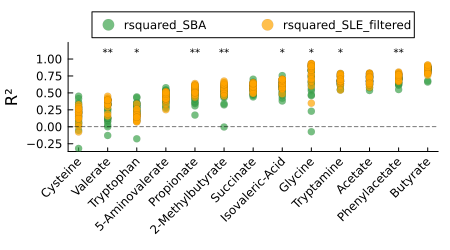

In [589]:
plot(
    ylabel="R²",
    bottommargin=10Plots.Measures.mm,
    xrotation=45,
    legend=:outertop,
    legendcolumns=2,)
@df pltdf dotplot!(
    string.(round.(:rsquared_SBA_mean, digits=6)), :value,
    group=:variable,
    mode=:none,
    alpha=.7,
    markerstrokewidth=0,
    xticks=((1:length(unique(:metabolite_name))).-.5, unique(:metabolite_name)),
    ylims=(-Inf, 1.2),
    widen=true,
    size=(450, 250),
    # label="Full lasso",
    c=[3 :orange],
)
hline!([0], c=:black, lw=.5, linestyle=:dash)
@df sigresults annotate!(
    string.(round.(:rsquared_SBA_mean, digits=6)), 
    ones(nrow(sigresults)) .+ 0.1,
    text.(
        replace.(repeat.("*", :poweroftest), r"(.{5})"=>s"\1\n"),
        # "1e-" .* string.(:poweroftest),
        7, :center,
    )
)

In [590]:
savefig(joinpath(pdir, "improvedmetabolites_sba-vs-filtSLE_dotplot.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/improvedmetabolites_sba-vs-filtSLE_dotplot.pdf"

In [591]:
oof_preds_SLE_lassos = leftjoin(filter(:resample => ==(4), oof_preds_df_stacked), fulllasso_oofpreds_stacked,
        on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> leftjoin(df, top3_oofpreds_stacked, on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> leftjoin(df, filter(:resample => ==(4), oof_preds_df_stacked_ogg), on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> leftjoin(df, filter(:resample => ==(4), oof_preds_df_stacked_filtered_ogg), on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> leftjoin(df, filter(:resample => ==(4), oof_preds_df_stacked_filtered_SLE), on = [:metabolite_name, :row_id], makeunique=true,) |>
    df -> select(df,
        :row_id,
        :metabolite_name,
        :truth,
        :preds => :preds_SLE,
        :preds_1 => :preds_ogg,
        :preds_2 => :preds_filtered_ogg,
        :preds_3 => :preds_filtered_SLE,
        :pred_full => :preds_full,
        :pred_top3 => :preds_top3,
    );

In [592]:
treeorder = indexin(getleafnames(subsettree), bbobs_trn.ID);

In [593]:
hadrusnames = bbobs_trn.ID[findall(contains.(bbobs_trn.species, "hadrus"))]
hadrus_treeidxs = indexin(hadrusnames, getleafnames(subsettree));
hadrustree = readnw(NewickTree.nwstr(NewickTree.extract(subsettree, hadrusnames)))
hadrusnames = getleafnames(hadrustree)
hadrus_treeidxs = indexin(hadrusnames, getleafnames(subsettree));

In [594]:
pltdf = filter(:metabolite_name => ==("Acetate"), oof_preds_SLE_lassos) |>
    df -> sort(df, :row_id);

In [595]:
hadruspltdf = pltdf[treeorder, :][hadrus_treeidxs,:]

Row,row_id,metabolite_name,truth,preds_SLE,preds_ogg,preds_filtered_ogg,preds_filtered_SLE,preds_full,preds_top3
,Int64,String31,Float64,Float64,Float64?,Float64?,Float64?,Float64?,Float64?
1,69,Acetate,-0.0560327,-0.333483,-0.143094,0.106531,-1.04879,-0.599118,2.30256
2,68,Acetate,-0.376019,-0.618599,-0.28081,-0.269059,-0.99243,-0.300093,2.23098
3,70,Acetate,-0.560045,-0.618599,-0.266762,-0.269059,-0.99243,-0.149325,2.23851
4,348,Acetate,0.504576,-0.618599,-0.207249,-0.269059,-0.99243,-0.693125,2.26756
5,344,Acetate,-0.388559,-2.04722,-1.80774,-0.399544,-0.906769,-0.460805,2.21566
6,207,Acetate,-2.56377,-0.171042,-0.385487,-1.63902,-0.99243,-0.732079,2.29773
7,67,Acetate,-0.177489,0.437046,-0.951072,0.0299215,-0.906769,-0.615918,2.23163
8,157,Acetate,0.489918,0.401936,0.368787,0.520556,-0.981156,0.325342,2.24444
9,312,Acetate,0.387263,0.00305167,0.516365,-0.158492,-1.04879,0.238725,2.31843


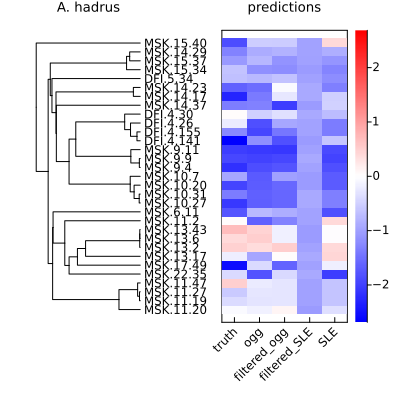

In [596]:
pltmtx = Matrix(hadruspltdf[:, [:truth, :preds_ogg, :preds_filtered_ogg, :preds_filtered_SLE, :preds_SLE]])
clims = getlims(pltmtx)
hp = heatmap(pltmtx,
    title="predictions",
    c=:bwr, clims=clims,
    xticks=(1:5, ["truth", "ogg", "filtered_ogg", "filtered_SLE", "SLE"]),
    yticks=false,
    framestyle=:box,
    xrotation=45,
)
tp = plot(hadrustree, fs=8, rightmargin=15Plots.Measures.mm, title="A. hadrus")
layout = @layout [a{.4w} b]
plot(tp, hp, layout=layout, link=:y, size=(400,400), titlefontsize=9)

In [597]:
savefig(joinpath(pdir, "Ahadrus_Acetate_treeandpredictions_truth-ogg-fogg-fSLE-SLE.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/Ahadrus_Acetate_treeandpredictions_truth-ogg-fogg-fSLE-SLE.pdf"

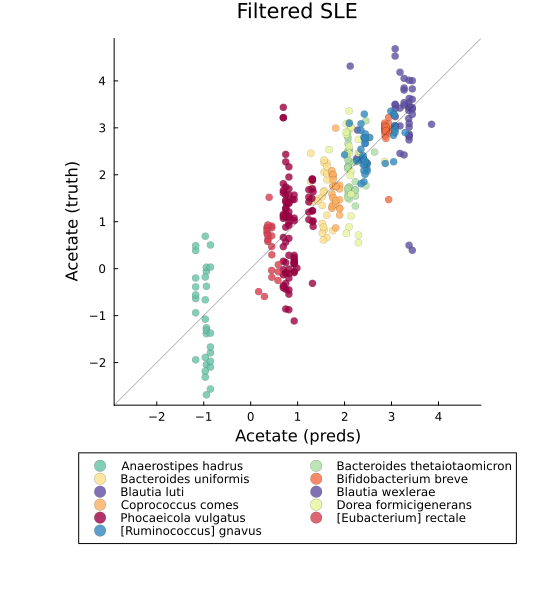

In [598]:
r = 5
metabolite_name = "Acetate"
predsdf = filter(:metabolite_name => ==(metabolite_name), oof_preds_df_stacked_filtered_SLE) |>
    df -> filter(:resample => ==(r), df)
@df predsdf scatter(
    :preds, :truth,
    group=trnYdf.species[:row_id],
    title="Filtered SLE",
    c=speciescolors_ordered,
    lims=extrema(vcat(:preds, :truth)),
    widen=true,
    ratio=1,
    size=(550,600),
    legend=:outerbottom,
    legend_column=2,
    markerstrokewidth=.1,
    alpha=.8,
    xlabel="$metabolite_name (preds)",
    ylabel="$metabolite_name (truth)",
)
plot!(identity, -20, 20, c=:black, alpha=.5, lw=0.5)

## OGGs splitting A. hadrus in fold trees

In [51]:
function hierarchical_q_test(mtx, grp1_idx, grp2_idx; nperms=100)
    # make null
    null_qs = map(1:nperms) do i
        perm_idx = shuffle(axes(mtx, 1))
        qs = mapslices(mtx, dims=1) do column
            q = pvalue(MannWhitneyUTest(column[perm_idx][grp1_idx], column[perm_idx][grp2_idx]))
        end
        minimum(qs)
    end
    # compare reference pval to null pvals
    qvals = mapslices(mtx, dims=1) do column
        pval = pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
        mean(null_qs .< pval)
    end |> vec
end

function log2FC(a, b) 
    mean(log2.(a .+ 1)) - mean(log2.(b .+ 1))
end

log2FC (generic function with 1 method)

In [52]:
rdir = projectdir("_research", "SLE_LASSO_featureinterpretation") |> mkpath
tdir = joinpath(rdir, "foldtrees") |> mkpath

"/Users/ben/projects/Doran_etal_2022/_research/SLE_LASSO_featureinterpretation/foldtrees"

In [53]:
seed!(424242)
cv = StratifiedCV(nfolds=NFOLDS, shuffle=true);
folds = vcat([train_test_pairs(cv, 1:sum(full_train_mask), trnYdf.species) for i in 1:REPS]...);

In [64]:
λ = 1e-3
REPS = 5
NFOLDS = 4
bbogg_names = biobank["oggs"].var_names[ogg_mask];

OGGSLE_coefdf_Ahadrus = DataFrame()
for (i, (fold_trn, fold_tst)) in collect(enumerate(folds))
# i = 1
    # (i, (fold_trn, fold_tst)) = (1, folds[1])
    # (i, (fold_trn, fold_tst)) = (2, folds[2])
    fold = ((i-1)%NFOLDS)+1
    repeat_num = ((i-1)÷NFOLDS)+1

    fold_oggmtx = bbmtx_trn[fold_trn, :]
    fold_rowobs = bbobs_trn[fold_trn, :]
    foldtree = readnw(open(readline, joinpath(tdir, "CSB_foldtree_folditer=$(i)_fold=$(fold)_resample=$(repeat_num).nw")));
    # ladderize!(foldtree, rev=false)

    fold_hadrusIDs = fold_rowobs.ID[contains.(fold_rowobs[!, "species"], "hadrus")]
    hadrusancestor = NewickTree.extract(foldtree, fold_hadrusIDs)

    for node in prewalk(hadrusancestor)
        #  if group size would be less than 1 skip node
        (isleaf(node) || any(isleaf.(children(node)))) && continue

        # 1 vs. sibling
        grp1_idx_1vsib = indexin(getleafnames(children(node)[1]), fold_rowobs.ID)
        grp2_idx_1vsib = indexin(getleafnames(children(node)[2]), fold_rowobs.ID)
        qs_1vssibling = hierarchical_q_test(fold_oggmtx, grp1_idx_1vsib, grp2_idx_1vsib)
    
        log2FCs_1vsib = mapslices(fold_oggmtx, dims=1) do column
            log2FC(column[grp1_idx_1vsib], column[grp2_idx_1vsib])
        end |> vec
    
        grp1_prp_exp_1vsib = mapslices(fold_oggmtx, dims=1) do column
            mean(column[grp1_idx_1vsib] .> 0)
        end |> vec
    
        grp2_prp_exp_1vsib = mapslices(fold_oggmtx, dims=1) do column
            mean(column[grp2_idx_1vsib] .> 0)
        end |> vec
    
        testdf = DataFrame(
            :fold => ((i-1)%NFOLDS)+1,
            :repeat_num => ((i-1)÷NFOLDS)+1,
            :fold_iter => i,
            :node_id => id(node),
            # :node_importance => nodeimportance,
            :oggnames => bbogg_names,
            :log2FC_1vsib => log2FCs_1vsib,
            :grp1_prp_exp_1vsib => grp1_prp_exp_1vsib,
            :grp2_prp_exp_1vsib => grp2_prp_exp_1vsib,
            :Q_1vsib => qs_1vssibling,
        )
        OGGSLE_coefdf_Ahadrus = vcat(OGGSLE_coefdf_Ahadrus, testdf)
    end
end

In [65]:
OGGSLE_coefdf_Ahadrus[!, :Q_1vsib_bh ] .= adjust(OGGSLE_coefdf_Ahadrus.Q_1vsib, BenjaminiHochberg())
OGGSLE_coefdf_Ahadrus_sig = filter(:Q_1vsib_bh => <(0.05), OGGSLE_coefdf_Ahadrus)

Row,fold,repeat_num,fold_iter,node_id,oggnames,log2FC_1vsib,grp1_prp_exp_1vsib,grp2_prp_exp_1vsib,Q_1vsib,Q_1vsib_bh
,Int64,Int64,Int64,UInt16,String,Float64,Float64,Float64,Float64,Float64
1,1,1,1,290,2Z7MS,-1.0,0.0,1.0,0.0,0.0
2,1,1,1,290,2Z7VI,-1.58496,0.0,1.0,0.0,0.0
3,1,1,1,290,2Z93T,-1.0,0.0,1.0,0.0,0.0
4,1,1,1,290,2ZHRR,-1.0,0.0,1.0,0.0,0.0
5,1,1,1,290,30J7Q,-1.0,0.0,1.0,0.0,0.0
6,1,1,1,290,321KG,-1.0,0.0,1.0,0.0,0.0
7,1,1,1,290,32RPI,-1.0,0.0,1.0,0.0,0.0
8,1,1,1,290,32WXD,-2.0,0.0,1.0,0.0,0.0
9,1,1,1,290,339ND,-1.0,0.0,1.0,0.0,0.0


In [66]:
CSV.write(joinpath(rdir, "OGGSLE_coefdf_Ahadrus_sig.csv"), OGGSLE_coefdf_Ahadrus_sig)

"/Users/ben/projects/Doran_etal_2022/_research/SLE_LASSO_featureinterpretation/OGGSLE_coefdf_Ahadrus_sig.csv"

In [67]:
OGGSLE_coefdf_Ahadrus_filt = subset(OGGSLE_coefdf_Ahadrus_sig,
        [:grp1_prp_exp_1vsib, :grp2_prp_exp_1vsib] => ((g1, g2) -> (g1 .>= 0.5) .|| (g2 .>= 0.5)),
        [:grp1_prp_exp_1vsib, :grp2_prp_exp_1vsib, :log2FC_1vsib] => (((g1, g2, lfc) -> @. (abs(g1 - g2) >= 0.75) || (abs(lfc) >= 1))),
    )

Row,fold,repeat_num,fold_iter,node_id,oggnames,log2FC_1vsib,grp1_prp_exp_1vsib,grp2_prp_exp_1vsib,Q_1vsib,Q_1vsib_bh
,Int64,Int64,Int64,UInt16,String,Float64,Float64,Float64,Float64,Float64
1,1,1,1,290,2Z7MS,-1.0,0.0,1.0,0.0,0.0
2,1,1,1,290,2Z7VI,-1.58496,0.0,1.0,0.0,0.0
3,1,1,1,290,2Z93T,-1.0,0.0,1.0,0.0,0.0
4,1,1,1,290,2ZHRR,-1.0,0.0,1.0,0.0,0.0
5,1,1,1,290,30J7Q,-1.0,0.0,1.0,0.0,0.0
6,1,1,1,290,321KG,-1.0,0.0,1.0,0.0,0.0
7,1,1,1,290,32RPI,-1.0,0.0,1.0,0.0,0.0
8,1,1,1,290,32WXD,-2.0,0.0,1.0,0.0,0.0
9,1,1,1,290,339ND,-1.0,0.0,1.0,0.0,0.0


In [86]:
replicable_OGGSLE_Ahadrus = OGGSLE_coefdf_Ahadrus_filt |>
    df -> groupby(df, :oggnames) |>
    df -> combine(df,
        :fold_iter => (x-> length(unique(x))) => :num_reproduced,
        [:fold_iter, :node_id] => ((fold, node) -> mean(sum(freqtable(node, fold), dims=1))) => :mean_num_branches_per_fold,
    ) |>
    df -> sort(df, [:num_reproduced, :mean_num_branches_per_fold], rev=true)

UPoggfunctions_Ahadrus = unique(upvarmeta[filter(!isnothing, indexin(replicable_OGGSLE_Ahadrus.oggnames, upvarmeta.og)), [:og, :description, :COG_categories]])
ogg_lasso_importance = filter(:metabolite_name => ==("Acetate"), coefdf_ogg) |>
    df -> unstack(df, :fold, :coef) |>
    df -> Matrix(df[:, 3:end]) |>
    mtx -> abs.(mean(mtx, dims=2)) |>
    vec

replicable_OGGSLE_Ahadrus[!, :ogg_feature_importance] .= ogg_lasso_importance[indexin(replicable_OGGSLE_Ahadrus.oggnames, bbogg_names)]
replicable_OGGSLE_Ahadrus[!, :is_in_topOGGmodel] .= 0
replicable_OGGSLE_Ahadrus[in.(replicable_OGGSLE_Ahadrus.oggnames, Ref(ogglasso_oggnames)), :is_in_topOGGmodel] .= 1
replicable_OGGSLE_Ahadrus = leftjoin(replicable_OGGSLE_Ahadrus, UPoggfunctions_Ahadrus, on= :oggnames => :og)

Row,oggnames,num_reproduced,mean_num_branches_per_fold,ogg_feature_importance,is_in_topOGGmodel,description,COG_categories
,String,Int64,Float64,Float64,Int64,String?,String7?
1,COG1343,20,1.6,0.0764619,0,"CRISPR (clustered regularly interspaced short palindromic repeat), is an adaptive immune system that provides protection against mobile genetic elements (viruses, transposable elements and conjugative plasmids). CRISPR clusters contain sequences complementary to antecedent mobile elements and target invading nucleic acids. CRISPR clusters are transcribed and processed into CRISPR RNA (crRNA). Functions as a ssRNA-specific endoribonuclease. Involved in the integration of spacer DNA into the CRISPR cassette",L
2,COG1518,20,1.55,0.0680063,0,maintenance of DNA repeat elements,L
3,2Z8RJ,20,1.4,0.00506188,0,Phage tail sheath C-terminal domain,S
4,COG3628,20,1.4,0.0210593,0,missing,S
5,COG3649,20,1.4,0.00295847,0,CRISPR-associated protein Cas7,L
6,COG4824,20,1.35,0.00538249,0,toxin secretion phage lysis holin,M
7,COG1106,20,1.35,0.00526202,0,"AAA domain, putative AbiEii toxin, Type IV TA system",S
8,COG3292,20,1.25,0.00624755,0,missing,T
9,COG4626,20,1.25,0.0183433,0,Terminase,S


In [87]:
CSV.write(joinpath(rdir, "replicable_OGGSLE_Ahadrus_sigOGGs.csv"), replicable_OGGSLE_Ahadrus)

"/Users/ben/projects/Doran_etal_2022/_research/SLE_LASSO_featureinterpretation/replicable_OGGSLE_Ahadrus_sigOGGs.csv"

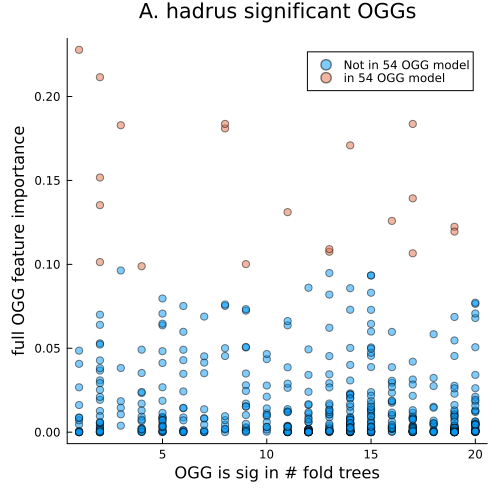

In [88]:
@df replicable_OGGSLE_Ahadrus scatter(
    :num_reproduced, :ogg_feature_importance,
    group=:is_in_topOGGmodel,
    alpha=0.5,
    title="A. hadrus significant OGGs",
    xlabel="OGG is sig in # fold trees",
    ylabel="full OGG feature importance",
    size=(500, 500),
    label=["Not in 54 OGG model" "in 54 OGG model"],
)

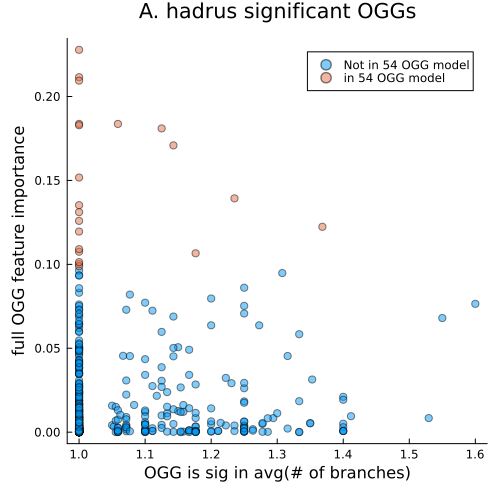

In [89]:
@df replicable_OGGSLE_Ahadrus scatter(
    :mean_num_branches_per_fold, :ogg_feature_importance,
    group=:is_in_topOGGmodel,
    alpha=0.5,
    title="A. hadrus significant OGGs",
    xlabel="OGG is sig in avg(# of branches)",
    ylabel="full OGG feature importance",
    size=(500, 500),
    label=["Not in 54 OGG model" "in 54 OGG model"],
)

In [90]:
sum(replicable_OGGSLE_Ahadrus.is_in_topOGGmodel)

21

## Plot OGGS that separate A. hadrus acetate clades

In [106]:
ogg_lasso_importance = filter(:metabolite_name => ==("Acetate"), coefdf_ogg) |>
    df -> unstack(df, :fold, :coef) |>
    df -> Matrix(df[:, 3:end]) |>
    mtx -> abs.(mean(mtx, dims=2)) |>
    vec;
ogglasso_mostimportant_mask = ogg_lasso_importance .> quantile(ogg_lasso_importance, .99);

In [107]:
sum(ogglasso_mostimportant_mask)

54

In [70]:
hadrusIDs = bbobs_trn.ID[contains.(bbobs_trn.species, "hadrus")]
hadrusancestor = NewickTree.extract(subsettree, hadrusIDs)

((((MSK.11.20:0.2185118,((MSK.11.19:0.007115789,MSK.11.27:0.007115789):0.01952213,MSK.11.47:0.02663792):0.1918739):0.6826251,(((MSK.22.35:0.7317976,(MSK.17.49:0.6459351,(MSK.13.17:0.5621654,(MSK.13.2:0.005003621,(MSK.13.6:0.004403209,MSK.13.43:0.004403209):0.0006004121):0.5571618):0.08376975):0.08586242):0.04431587,MSK.11.2:0.7761134):0.120572,MSK.6.11:0.8966854):0.004451496):0.04604542,((((((((MSK.10.27:0.01044862,MSK.10.31:0.01044862):0.05242078,MSK.10.20:0.0628694):0.03998712,MSK.10.7:0.1028565):0.6292068,(((MSK.9.4:0.008945339,MSK.9.9:0.008945339):0.0874901,MSK.9.11:0.09643544):0.566493,(((DFI.4.141:0.03331342,DFI.4.155:0.03331342):0.06626768,DFI.4.26:0.0995811):0.06017711,DFI.4.30:0.1597582):0.5031702):0.06913491):0.130885,MSK.14.37:0.8629483):0.003442671,(MSK.14.17:0.07033848,MSK.14.23:0.07033848):0.7960525):0.04170974,DFI.5.34:0.9081008):0.01721933,(MSK.15.34:0.1403227,(MSK.15.37:0.1083422,MSK.14.29:0.1083422):0.03198043):0.7849974):0.02186222):0.1228962,MSK.15.40:1.070079);

In [71]:
node = children(hadrusancestor)[1]

(((MSK.11.20:0.2185118,((MSK.11.19:0.007115789,MSK.11.27:0.007115789):0.01952213,MSK.11.47:0.02663792):0.1918739):0.6826251,(((MSK.22.35:0.7317976,(MSK.17.49:0.6459351,(MSK.13.17:0.5621654,(MSK.13.2:0.005003621,(MSK.13.6:0.004403209,MSK.13.43:0.004403209):0.0006004121):0.5571618):0.08376975):0.08586242):0.04431587,MSK.11.2:0.7761134):0.120572,MSK.6.11:0.8966854):0.004451496):0.04604542,((((((((MSK.10.27:0.01044862,MSK.10.31:0.01044862):0.05242078,MSK.10.20:0.0628694):0.03998712,MSK.10.7:0.1028565):0.6292068,(((MSK.9.4:0.008945339,MSK.9.9:0.008945339):0.0874901,MSK.9.11:0.09643544):0.566493,(((DFI.4.141:0.03331342,DFI.4.155:0.03331342):0.06626768,DFI.4.26:0.0995811):0.06017711,DFI.4.30:0.1597582):0.5031702):0.06913491):0.130885,MSK.14.37:0.8629483):0.003442671,(MSK.14.17:0.07033848,MSK.14.23:0.07033848):0.7960525):0.04170974,DFI.5.34:0.9081008):0.01721933,(MSK.15.34:0.1403227,(MSK.15.37:0.1083422,MSK.14.29:0.1083422):0.03198043):0.7849974):0.02186222):0.1228962;

In [82]:
using Random: seed!

In [97]:
function hierarchical_q_test(mtx, grp1_idx, grp2_idx; nperms=100, seed=424242)
    # make null
    seed!(seed)
    null_qs = map(1:nperms) do i
        perm_idx = shuffle(axes(mtx, 1))
        qs = mapslices(mtx, dims=1) do column
            q = pvalue(MannWhitneyUTest(column[perm_idx][grp1_idx], column[perm_idx][grp2_idx]))
        end
        minimum(qs)
    end
    # compare reference pval to null pvals
    qvals = mapslices(mtx, dims=1) do column
        pval = pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
        mean(null_qs .< pval)
    end |> vec
end

hierarchical_q_test (generic function with 1 method)

In [108]:
 # 1 vs. sibling
 grp1_idx = indexin(getleafnames(children(node)[1]), bbobs_trn.ID)
 grp2_idx = indexin(getleafnames(children(node)[2]), bbobs_trn.ID)
 qs = hierarchical_q_test(bbmtx_trn, grp1_idx, grp2_idx, nperms=100)
 qs_bh = adjust(qs, BenjaminiHochberg()) 
 oggsigmask = qs_bh .< 0.05;

In [213]:
log2fc_measures = mapslices(bbmtx_trn, dims=1) do col
    log2FC(col[grp1_idx], col[grp2_idx])
end |> vec;

In [109]:
sum(oggsigmask)

26

In [110]:
sum(oggsigmask .& ogglasso_mostimportant_mask)

1

In [115]:
mean(ogg_lasso_importance .< 0.001)

0.7573866764543953

In [116]:
sum(quantile(ogg_lasso_importance, .75) .< ogg_lasso_importance[oggsigmask] .< quantile(ogg_lasso_importance, .99))

15

In [117]:
sum(ogg_lasso_importance[oggsigmask] .< quantile(ogg_lasso_importance, .75))

10

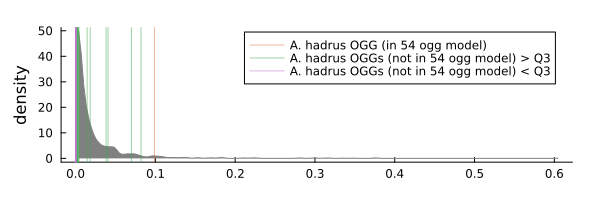

In [127]:
p1 = plot(ylabel="density", size=(600, 200), margin=5Plots.Measures.mm)
density!(filter(>(0.001), ogg_lasso_importance), c=:grey, trim=true, fill=0)
vline!(ogg_lasso_importance[oggsigmask .& ogglasso_mostimportant_mask], c=2, alpha=.5, label="A. hadrus OGG (in 54 ogg model)")
vline!(
    ogg_lasso_importance[oggsigmask][
        quantile(ogg_lasso_importance, .75) .< ogg_lasso_importance[oggsigmask] .< quantile(ogg_lasso_importance, .99)
    ], 
    c=3, 
    alpha=.5, 
    label="A. hadrus OGGs (not in 54 ogg model) > Q3"
)
vline!(
    ogg_lasso_importance[oggsigmask][
        ogg_lasso_importance[oggsigmask] .< quantile(ogg_lasso_importance, .75)
    ],
    c=4, alpha=.5, 
    label="A. hadrus OGGs (not in 54 ogg model) < Q3"
)

In [128]:
savefig(joinpath(pdir, "Ahadrus_sigoggs_distributed_based_on_fulloggmodel_featureimportance.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/Ahadrus_sigoggs_distributed_based_on_fulloggmodel_featureimportance.pdf"

In [146]:
pie([1, 15, 10], c=[2,3,4],
    labels=["in 54" "not in 54 > Q3" "not in 54 < Q3"],
)
savefig(joinpath(pdir, "piechart_Ahadrus_sigoggs_distributed_based_on_fulloggmodel_featureimportance.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolite_SBA_Lasso_model_mark2/piechart_Ahadrus_sigoggs_distributed_based_on_fulloggmodel_featureimportance.pdf"

In [154]:
upvarmeta = CSV.read(datadir("exp_raw","UP7047","UPcolmeta.csv"), DataFrame);

In [153]:
discoverable_oggnames = bbogg_names[oggsigmask .& ogglasso_mostimportant_mask]
semidiscoverable_oggnames = bbogg_names[oggsigmask][quantile(ogg_lasso_importance, .75) .< ogg_lasso_importance[oggsigmask] .< quantile(ogg_lasso_importance, .99)]
nondiscoverable_oggnames = bbogg_names[oggsigmask][ogg_lasso_importance[oggsigmask] .< quantile(ogg_lasso_importance, .75)]

10-element Vector{String}:
 "31KJ2"
 "COG0191"
 "COG0246"
 "COG0328"
 "COG1192"
 "COG3843"
 "COG3958"
 "COG3959"
 "COG4509"
 "COG4886"

In [170]:
filter(!isnothing,indexin(semidiscoverable_oggnames, upvarmeta.og))

13-element Vector{Union{Nothing, Int64}}:
 4561
 7444
 8217
  604
  609
  733
  959
 2132
 2706
 2761
 3327
 3920
 4044

In [191]:
discoverableoggsdf = upvarmeta[indexin(discoverable_oggnames, upvarmeta.og), :]
discoverableoggsdf[!,:discoverability] .= "LASSO discoverable"
discoverableoggsdf

Row,og,level,nm,description,COG_categories,OG_ID,discoverability
,String7,Int64,Int64,String?,String7,String15,String
1,COG3550,2,3605,kinase activity,S,COG3550@2,LASSO discoverable


In [190]:
semidiscoverableoggsdf = outerjoin(upvarmeta[filter(!isnothing,indexin(semidiscoverable_oggnames, upvarmeta.og)), :],
DataFrame(
    :og => semidiscoverable_oggnames[isnothing.(indexin(semidiscoverable_oggnames, upvarmeta.og))],
    :description => ["Cell surface heme-binding protein Shp", "Cro/C1-type HTH DNA-binding domain"],
),
on=[:og, :description],
)
semidiscoverableoggsdf[!,:discoverability] .= "LASSO semidiscoverable"
semidiscoverableoggsdf

Row,og,level,nm,description,COG_categories,OG_ID,discoverability
,String,Int64?,Int64?,String?,String7?,String15?,String
1,2Z80J,2,55,"Psort location Cytoplasmic, score 8.87",S,2Z80J@2,LASSO semidiscoverable
2,32SVU,2,77,"Psort location CytoplasmicMembrane, score",S,32SVU@2,LASSO semidiscoverable
3,32Z5Y,2,57,Domain of unknown function (DUF4258),S,32Z5Y@2,LASSO semidiscoverable
4,COG0609,2,11268,iron ion homeostasis,P,COG0609@2,LASSO semidiscoverable
5,COG0614,2,13606,"abc-type fe3 -hydroxamate transport system, periplasmic component",P,COG0614@2,LASSO semidiscoverable
6,COG0741,2,13660,lytic transglycosylase activity,M,COG0741@2,LASSO semidiscoverable
7,COG1120,2,8515,ATPase activity,HP,COG1120@2,LASSO semidiscoverable
8,COG2832,2,1590,Protein of unknown function (DUF454),F,COG2832@2,LASSO semidiscoverable
9,COG3451,2,4228,multi-organism process,U,COG3451@2,LASSO semidiscoverable


In [192]:
nondiscoverableoggsdf = outerjoin(upvarmeta[filter(!isnothing,indexin(nondiscoverable_oggnames, upvarmeta.og)), :],
    DataFrame(
        :og => nondiscoverable_oggnames[isnothing.(indexin(nondiscoverable_oggnames, upvarmeta.og))],
        :description => ["Psort location Cytoplasmic, score 8.87"],
    ),
    on=[:og, :description],
)
nondiscoverableoggsdf[!,:discoverability] .= "LASSO nondiscoverable"
nondiscoverableoggsdf

Row,og,level,nm,description,COG_categories,OG_ID,discoverability
,String,Int64?,Int64?,String?,String7?,String15?,String
1,COG0191,2,5778,fructose-bisphosphate aldolase activity,G,COG0191@2,LASSO nondiscoverable
2,COG0246,2,3298,mannitol metabolic process,G,COG0246@2,LASSO nondiscoverable
3,COG0328,2,5074,RNA-DNA hybrid ribonuclease activity,L,COG0328@2,LASSO nondiscoverable
4,COG1192,2,13729,plasmid maintenance,D,COG1192@2,LASSO nondiscoverable
5,COG3843,2,3457,relaxase mobilization nuclease domain protein,U,COG3843@2,LASSO nondiscoverable
6,COG3958,2,2176,transketolase activity,G,COG3958@2,LASSO nondiscoverable
7,COG3959,2,2166,transketolase activity,G,COG3959@2,LASSO nondiscoverable
8,COG4509,2,858,Sortase family,S,COG4509@2,LASSO nondiscoverable
9,COG4886,2,8357,regulation of response to stimulus,S,COG4886@2,LASSO nondiscoverable


In [193]:
rdir

"/Users/ben/projects/Doran_etal_2022/_research/SLE_LASSO_featureinterpretation"

In [195]:
vcat(
    discoverableoggsdf,
    semidiscoverableoggsdf,
    nondiscoverableoggsdf,
) |> df->CSV.write(joinpath(rdir, "Ahadrus_largenode_sigoggs_annotations.csv"), df)

"/Users/ben/projects/Doran_etal_2022/_research/SLE_LASSO_featureinterpretation/Ahadrus_largenode_sigoggs_annotations.csv"

In [122]:
sum(ogg_lasso_importance[ogglasso_mostimportant_mask] .> ogg_lasso_importance[oggsigmask .& ogglasso_mostimportant_mask])

53

In [123]:
ogg_lasso_importance[oggsigmask .& ogglasso_mostimportant_mask]

1-element Vector{Float64}:
 0.0988719815728102

In [124]:
sum(ogg_lasso_importance .> quantile(ogg_lasso_importance, .995))

28

## Plot Ahadrus sig OGGs

In [198]:
pltoggsdf = CSV.read(joinpath(rdir, "Ahadrus_largenode_sigoggs_annotations.csv"), DataFrame)

Row,og,level,nm,description,COG_categories,OG_ID,discoverability
,String7,Int64?,Int64?,String,String3?,String15?,String31
1,COG3550,2,3605,kinase activity,S,COG3550@2,LASSO discoverable
2,2Z80J,2,55,"Psort location Cytoplasmic, score 8.87",S,2Z80J@2,LASSO semidiscoverable
3,32SVU,2,77,"Psort location CytoplasmicMembrane, score",S,32SVU@2,LASSO semidiscoverable
4,32Z5Y,2,57,Domain of unknown function (DUF4258),S,32Z5Y@2,LASSO semidiscoverable
5,COG0609,2,11268,iron ion homeostasis,P,COG0609@2,LASSO semidiscoverable
6,COG0614,2,13606,"abc-type fe3 -hydroxamate transport system, periplasmic component",P,COG0614@2,LASSO semidiscoverable
7,COG0741,2,13660,lytic transglycosylase activity,M,COG0741@2,LASSO semidiscoverable
8,COG1120,2,8515,ATPase activity,HP,COG1120@2,LASSO semidiscoverable
9,COG2832,2,1590,Protein of unknown function (DUF454),F,COG2832@2,LASSO semidiscoverable


In [199]:
treeorder = indexin(getleafnames(subsettree), bbobs_trn.ID);

In [200]:
hadrusnames = bbobs_trn.ID[findall(contains.(bbobs_trn.species, "hadrus"))]
hadrus_treeidxs = indexin(hadrusnames, getleafnames(subsettree));
hadrustree = readnw(NewickTree.nwstr(NewickTree.extract(subsettree, hadrusnames)))
hadrusnames = getleafnames(hadrustree)
hadrus_treeidxs = indexin(hadrusnames, getleafnames(subsettree));

In [216]:
oggorder = sortperm(log2fc_measures[indexin(pltoggsdf.og, bbogg_names)]);

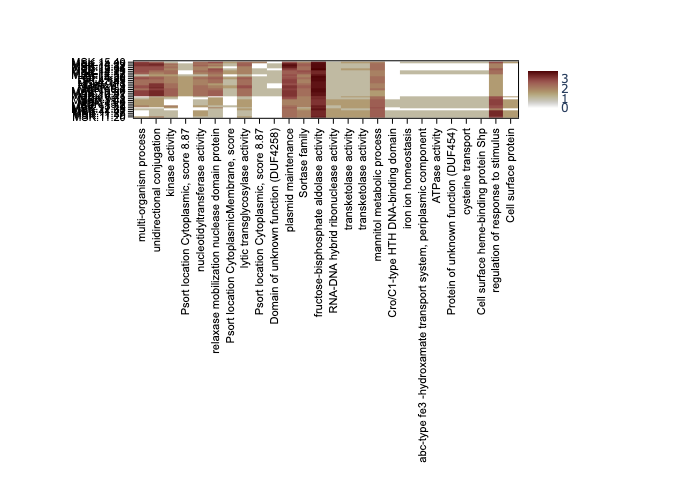

In [250]:
plotlyjs()
pltmtx = bbmtx_trn[treeorder, :][hadrus_treeidxs,indexin(pltoggsdf.og, bbogg_names)][:, oggorder]
pltmtx = log2.(pltmtx .+ 1)
heatmap(pltmtx, 
    c=:bilbao,
    yticks=(1:size(pltmtx, 1), hadrusnames),
    xticks=(1:size(pltmtx,2), pltoggsdf.description[oggorder]),
    xrotation=90,
    size=(600,600),
    tickdirection=:out,
    framestyle=:box,
    bottommargin=-40Plots.Measures.mm,
)

In [251]:
savefig(joinpath(pdir, "Ahadrus_sigoggs_heatmap_annotatedbyfunction.pdf"))
gr()

Plots.GRBackend()

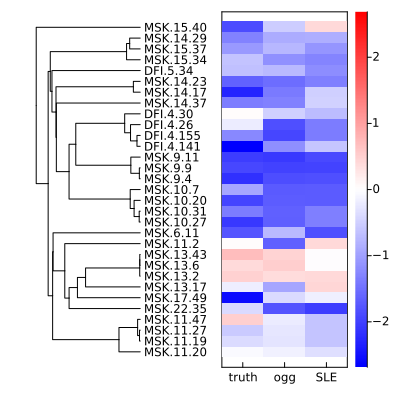

In [ ]:
pltmtx = Matrix(hadruspltdf[:, [:truth, :preds_ogg, :preds_SLE]])
clims = getlims(pltmtx)
hp = heatmap(pltmtx,
    c=:bwr, clims=clims,
    xticks=(1:3, ["truth", "ogg", "SLE"]),
    yticks=false,
    framestyle=:box
)
tp = plot(hadrustree, fs=8, rightmargin=15Plots.Measures.mm)
layout = @layout [a{.4w} b]
plot(tp, hp, layout=layout, link=:y, size=(400,400))

In [254]:
clipboard(improvedmetabolite_names)

## Number of params for SLE models

In [165]:
metabolite_num_params = groupby(coefdf, [:metabolite_name, :fold]) |>
    df -> combine(df, :coef => (x->sum(x.>0)) => :num_params) |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df, :num_params => mean) |>
    df -> sort(df, :num_params_mean)
    # df -> filter(:metabolite_name => ==("Acetate"), df)

Row,metabolite_name,num_params_mean
,String31,Float64
1,4-Methylvalerate,7.75
2,Desaminotyrosine,10.05
3,p-Cresol,10.8
4,Phenol,12.45
5,Catechol,15.75
6,Tyrosine,25.05
7,3-Aminoisobutyrate,37.15
8,Leucine,37.85
9,Valine,39.75


In [166]:
CSV.write(joinpath(rdir, "metabolite_avg_num_params_SLE.csv"),metabolite_num_params)

"/Users/ben/projects/Doran_etal_2022/_research/metabolite_SBA_Lasso_model_mark2/metabolite_avg_num_params_SLE.csv"

In [158]:
coefdf

Row,metabolite_name,fold,treedepth,class,node_id,coef,treedist
,String31,Int64,String7,Int64,String15,Float64,Int64
1,Propionate,1,node,1,node__1,0.0,0
2,Propionate,1,node,2,node__2,0.921097,1
3,Propionate,1,node,3,node__3,-0.458776,1
4,Propionate,1,node,4,node__4,1.05433,2
5,Propionate,1,node,5,node__5,0.0,2
6,Propionate,1,node,6,node__6,-1.22621,2
7,Propionate,1,node,7,node__7,-0.0,2
8,Propionate,1,node,8,node__8,-0.0,3
9,Propionate,1,node,9,node__9,0.766203,3


In [173]:
biobank["UPorder_oggs"].obsm

Muon.AlignedMapping{Tuple{1 => 1}, String, AnnData} with 1 entry:
  "inferredLSVs" => [-0.00710957 -0.016346 … 0.0620108 -0.195298; -0.0101422 -0…